In [22]:
%matplotlib inline
import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import KMeans, BisectingKMeans
from sklearn.metrics import silhouette_score
from collections import Counter



from collections import defaultdict
from scipy.stats.stats import pearsonr
from sklearn.preprocessing import StandardScaler, MinMaxScaler


<ipython-input-22-8d19aea86e6b>:18: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import pearsonr


In [23]:
import pandas as pd
file_path = ('df_clean.csv')
df = pd.read_csv(file_path)

file_path = ('df_clean.csv')
df = pd.read_csv(file_path)
# Seleziona le colonne desiderate
columns_of_interest = ['duration_ms','acousticness', 'instrumentalness', 'loudness', 'valence', 'danceability', 'energy', 'n_beats','popularity','liveness','tempo','processing','speechiness', 'time_signature']
# Crea un nuovo DataFrame utilizzando solo le colonne di interesse
df_clus = df[columns_of_interest].copy()

# Visualizza le prime righe del DataFrame 'df_clus'
print(df_clus.head())


   duration_ms  acousticness  instrumentalness  loudness  valence  \
0       241760      0.302000           0.53600   -12.529   0.6350   
1       444000      0.283000           0.93400   -24.801   0.0336   
2       333506      0.000089           0.80000    -7.445   0.4890   
3       269800      0.066400           0.00127    -5.607   0.3850   
4       307651      0.000576           0.09690   -11.340   0.6370   

   danceability  energy  n_beats  popularity  liveness    tempo  processing  \
0         0.690   0.513    567.0          46     0.281  142.221    1.279305   
1         0.069   0.196    617.0           0     0.360   75.596    2.367412   
2         0.363   0.854    652.0           3     0.262  116.628    3.700483   
3         0.523   0.585    619.0          23     0.117  140.880    1.279305   
4         0.643   0.687    733.0          25     0.299  143.956    4.067086   

   speechiness  time_signature  
0       0.0975             4.0  
1       0.0805             4.0  
2       0.0

## **KMEANS**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 8: 1500 elementi
Cluster 7: 840 elementi
Cluster 3: 1477 elementi
Cluster 2: 1598 elementi
Cluster 9: 2008 elementi
Cluster 6: 2006 elementi
Cluster 0: 889 elementi
Cluster 5: 1387 elementi
Cluster 1: 1706 elementi
Cluster 4: 1116 elementi


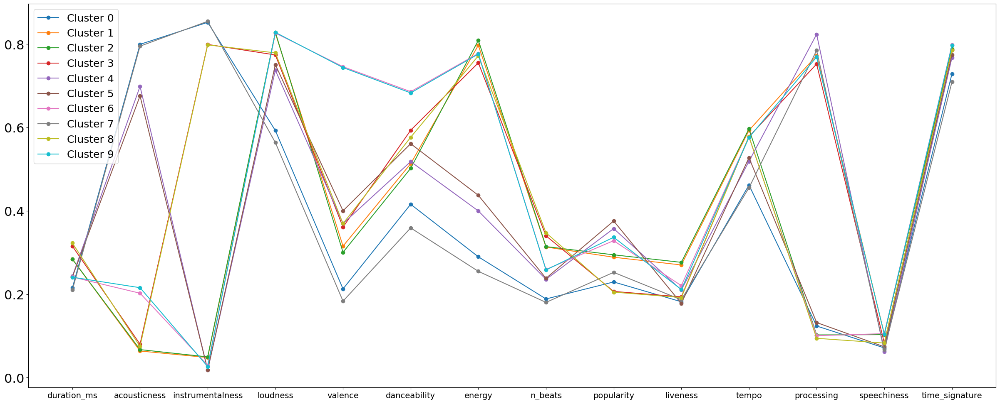

In [20]:
def parallel_plot(k,scale,features):
  plt.figure(figsize=(30, 12))
  #centers = scaler.inverse_transform(centers)
  for i in range(0, len(centers)):
      plt.plot(centers[i], marker='o', label='Cluster %s' % i)
  plt.tick_params(axis='both', which='major', labelsize=22)
  plt.xticks(range(0, len(features)), features, fontsize=14)
  plt.legend(fontsize=18)
  plt.show()


X = df_clus.values
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(X)
X_scal = scaler.transform(X)

k=10

kmeans = KMeans(n_clusters=k, max_iter=1000).fit(X_scal)
centers = kmeans.cluster_centers_
label = kmeans.labels_
df['Cluster'] = kmeans.labels_
# Supponiamo che 'labels' contenga le etichette dei cluster assegnate
cluster_counts = Counter(label)

# Stampiamo i conteggi dei cluster su righe separate
for cluster, count in cluster_counts.items():
      print(f"Cluster {cluster}: {count} elementi")
parallel_plot(k,X_scal,df_clus.columns)

Ecco un'analisi di ciò che il grafico suggerisce:

- **Duration_ms**: La maggior parte dei cluster mostra valori simili per la durata delle tracce, con alcune variazioni minori. Non sembra essere una caratteristica distintiva tra i cluster. --> POTREMMO ELIMINARLA (invece no)

- **Acousticness**: Questa caratteristica mostra una variazione significativa tra i cluster. Ad esempio, alcuni cluster hanno valori di acusticità molto più alti rispetto ad altri, il che potrebbe indicare che questi cluster sono composti da brani con elementi acustici più marcati.

- **Instrumentalness**: Si vede una variazione simile all'acusticità, con alcuni cluster che mostrano valori più elevati, indicando una presenza più forte di tracce strumentali.

- **Loudness**: La maggior parte dei cluster sembra avere livelli di volume elevati.

- **Valence**: La valenza, che misura la positività trasmessa da un brano, varia tra i cluster, suggerendo che alcuni cluster potrebbero essere più allegri o positivi nel tono rispetto ad altri.

- **Danceability**: I cluster variano in termini di ballabilità, indicando che alcuni cluster potrebbero essere più orientati verso brani da ballo.

- **Energy**: L'energia mostra una variazione significativa, con alcuni cluster che presentano livelli di energia più alti, forse corrispondenti a generi più dinamici o intensi.

- **N_beats**: Questa caratteristica, che probabilmente rappresenta il numero di battiti in una traccia, mostra alcune variazioni tra i cluster.

- **Popularity**: La popolarità varia tra i cluster, il che potrebbe riflettere come le caratteristiche dei brani di un cluster si allineano con le tendenze musicali popolari.

- **Liveness**: La variazione qui suggerisce che alcuni cluster potrebbero contenere brani che suonano più "dal vivo" o che hanno una sensazione di esibizione dal vivo.

- **Tempo**: La velocità dei brani varia tra i cluster, indicando differenze nello stile ritmico.

- **Processing**: Questa caratteristica mostra una variazione significativa, con alcuni cluster che presentano valori molto più alti, indicando forse una maggiore complessità o una maggiore elaborazione nella produzione musicale.

- **Speechiness**: La presenza di parole parlate nei brani varia tra i cluster, con alcuni che mostrano valori più elevati.

- **Time_signature**: La maggior parte dei cluster ha una firma temporale simile, con poche variazioni.

In sintesi, questo grafico parallelo rivela come i cluster differiscano l'uno dall'altro in base a una serie di caratteristiche musicali. Ad esempio, se un cluster ha valori elevati per "acousticness" e "valence", ma bassi per "energy", potrebbe rappresentare brani acustici e positivi ma tranquilli. Un altro cluster con alti valori di "energy" e "danceability" potrebbe rappresentare brani energetici e ballabili.

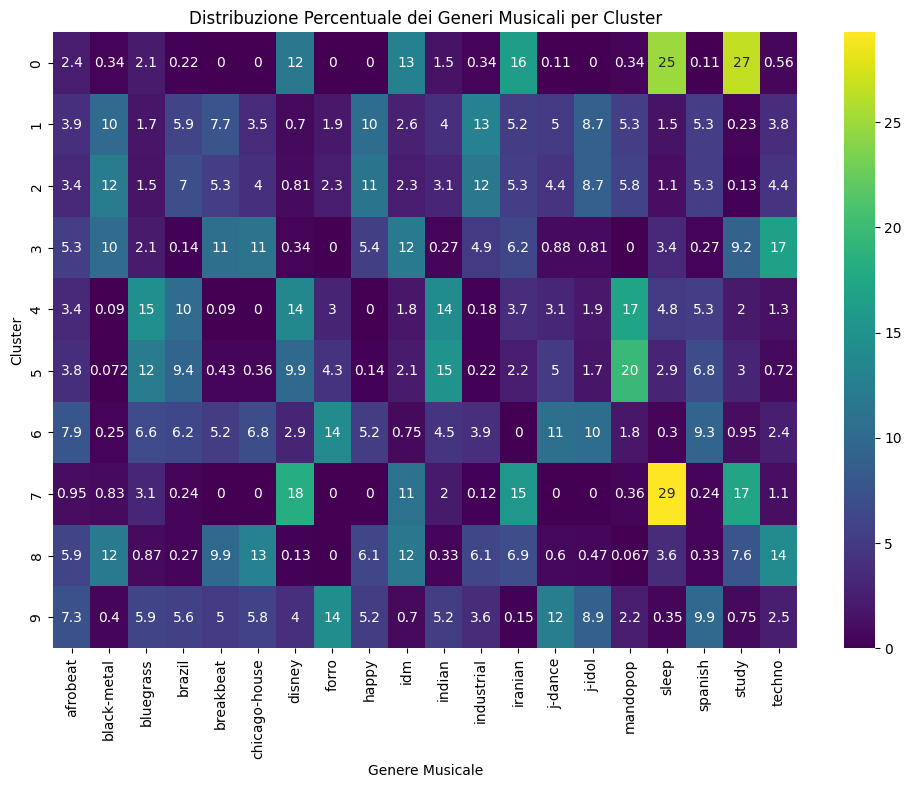

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt
# Assicurati che i cluster siano già stati assegnati al dataframe come una colonna 'Cluster'
# Raggruppa per cluster e genere
genre_distribution = df.groupby(['Cluster', 'genre']).size().unstack(fill_value=0)

# Calcola la percentuale di brani in ogni genere per ogni cluster
genre_percentage = genre_distribution.div(genre_distribution.sum(axis=1), axis=0) * 100


plt.figure(figsize=(12, 8))
sns.heatmap(genre_percentage, annot=True, cmap='viridis')
plt.title('Distribuzione Percentuale dei Generi Musicali per Cluster')
plt.xlabel('Genere Musicale')
plt.ylabel('Cluster')
plt.show()


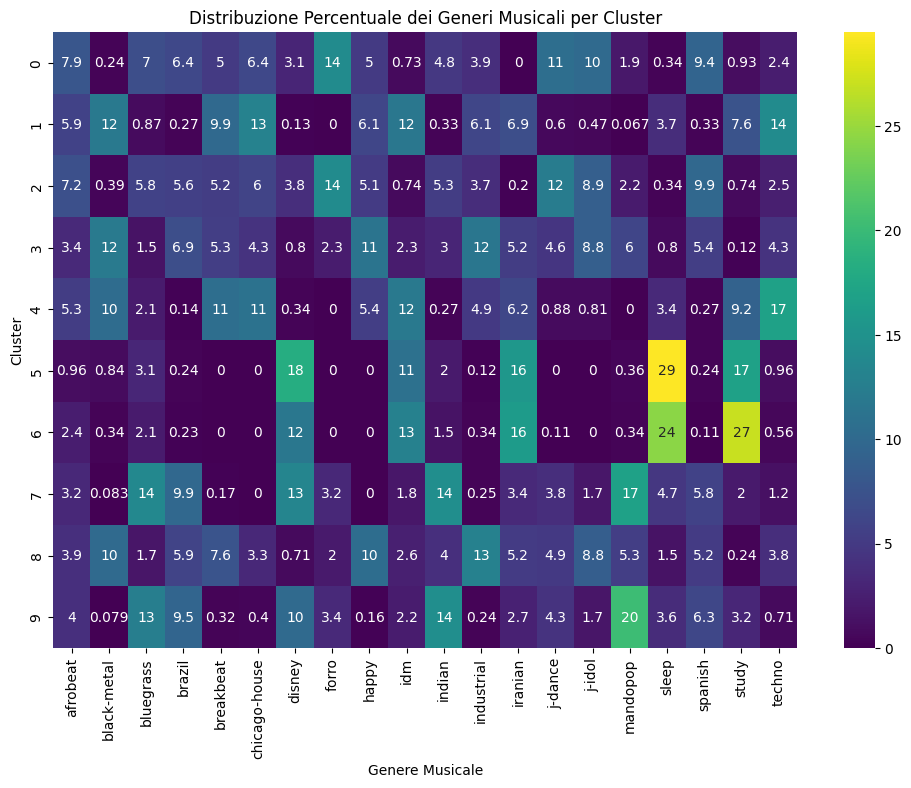

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(genre_percentage, annot=True, cmap='viridis')
plt.title('Distribuzione Percentuale dei Generi Musicali per Cluster')
plt.xlabel('Genere Musicale')
plt.ylabel('Cluster')
plt.show()


La heatmap mostra la distribuzione percentuale dei generi musicali per ciascun cluster. I colori rappresentano la percentuale di brani in ogni genere all'interno di ogni cluster, con il giallo che indica percentuali più alte e il viola percentuali più basse.

La combinazione dell'analisi del grafico parallelo con la distribuzione percentuale dei generi musicali per cluster può fornire una visione più completa di come le caratteristiche musicali si associano a specifici generi all'interno dei cluster. Osservando entrambi i grafici, possiamo cercare di dedurre le relazioni tra le qualità sonore dei brani e i generi musicali che predominano in ogni gruppo.

Analizziamo questa interrelazione per alcuni cluster:

- **Cluster 0**: I generi predominanti qui includono "mandopop", "Indian", "Disney" e "bluegrass", che tendono ad avere sonorità più acustiche e tradizionali. Questo si allinea con la distribuzione delle caratteristiche musicali che mostrano valori medi in energia e ballabilità e forse più alti in acusticità.

- **Cluster 1**: Dominato da "black-metal" e "industrial", che sono generi intensi e duri, il grafico parallelo potrebbe mostrare alti livelli di energia, volume e potenzialmente bassi livelli di acusticità e valenza.

- **Cluster 2**: Con un mix di "black metal", "Chicago-house", "techno" e "idm", aspettiamo di vedere un'alta energia e ballabilità, che corrisponde a brani ritmati ed elettronici.

- **Cluster 3**: Con generi come "j-dol", "j-dance", "Spanish" e "happy", aspettiamo di vedere alta ballabilità e valenza, suggerendo musica vivace e ottimista.

- **Cluster 4**: Contiene "black metal", "breakbeat", "Chicago house" e "techno", che indicano una predilezione per ritmi intensi, probabilmente riflessi da alta energia e ballabilità nel grafico parallelo.

- **Cluster 5**: I generi "brazil", "Disney", "Indian" e "mandopop" sono culturalmente vari e potrebbero avere caratteristiche sonore melodiche o tematiche comuni, come una maggiore acusticità o valenza nel grafico parallelo.

- **Cluster 6**: È dominato da "sleep", che implica bassi livelli di energia e ballabilità e probabilmente alta acusticità, riflettendo la musica calmante e rilassante.

- **Cluster 7**: Caratterizzato fortemente da "happy" e da un'alta percentuale di "sleep" e "study", questo cluster potrebbe avere caratteristiche sonore che riflettono la tranquillità e la positività, con bassa energia ma alta acusticità.

- **Cluster 8**: Ha un mix di generi vivaci come "forro", "j-dance", "jodel" e "spanish", che potrebbero tradursi in alta ballabilità e valenza nel grafico parallelo.

Da notare che i cluster con percentuali particolarmente alte in un genere specifico suggeriscono che tali cluster sono fortemente caratterizzati da quei generi musicali. Ad esempio, il cluster 6, che ha una alta percentuale in "sleep", potrebbe essere distintamente associato a brani che hanno caratteristiche sonore calme e tranquille.

La presenza di generi come "happy" e "sleep" in cluster specifici (7 e 6 rispettivamente) potrebbe anche indicare che l'algoritmo di clustering è riuscito a catturare alcune distinzioni emotive o funzionali tra i brani.

Queste informazioni possono essere preziose per la curazione di playlist, il targeting di raccomandazioni musicali o la segmentazione del pubblico per il marketing.



Esaminare gli attributi che hanno portato a tali raggruppamenti, in particolare per i cluster con una forte predominanza di uno o due generi.

ES. cluster 7-6

Per il cluster7-6, che sembra essere dominato dal genere "sleep" e "study", ci aspetteremmo che le tracce abbiano:

Bassa energy: la musica destinata al sonno tende ad essere rilassante e calma.
Alta acousticness: spesso la musica per il sonno utilizza strumenti acustici per creare un ambiente sereno.
Bassa tempo: ritmi lenti sono preferiti per facilitare il relax.
Bassa danceability e valence: non sono qualità ricercate nella musica per il sonno.
Alta instrumentalness: la musica per il sonno potrebbe tendere a essere strumentale, senza testi che potrebbero distrarre.

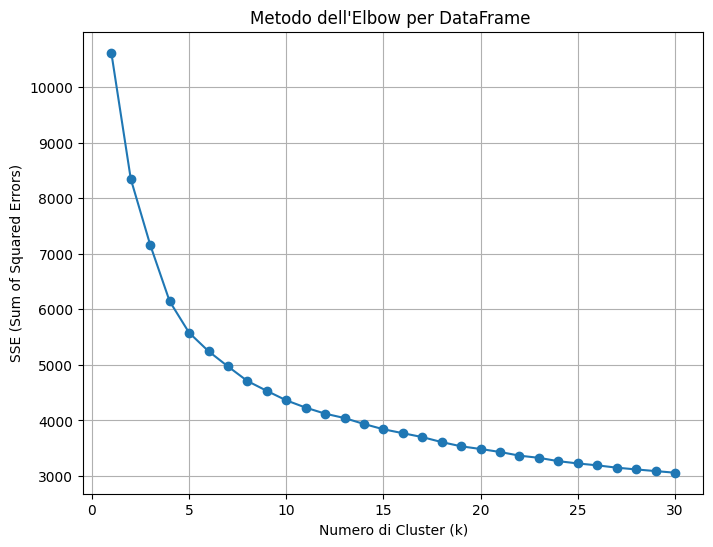

Numero di cluster: 2, SSE: 8346.498923565698, Silhouette Score: 0.24501432720969013, Calinski-Harabasz Score: 3953.115091435776, Davies-Bouldin Score: 8.332068633226376
Numero di cluster: 3, SSE: 7160.457521849545, Silhouette Score: 0.21840089035680746, Calinski-Harabasz Score: 3506.6590971608907, Davies-Bouldin Score: 3.5991561686441877
Numero di cluster: 4, SSE: 6144.783823165005, Silhouette Score: 0.20640512031279495, Calinski-Harabasz Score: 3524.1619468756608, Davies-Bouldin Score: 87.55244139547563
Numero di cluster: 5, SSE: 5579.210737856016, Silhouette Score: 0.2012874383971701, Calinski-Harabasz Score: 3278.8932440180224, Davies-Bouldin Score: 56.6133756542575
Numero di cluster: 6, SSE: 5246.046271856949, Silhouette Score: 0.20082423362258053, Calinski-Harabasz Score: 2973.9525635304594, Davies-Bouldin Score: 57.58682267539575
Numero di cluster: 7, SSE: 4959.092568755103, Silhouette Score: 0.19040427506816085, Calinski-Harabasz Score: 2761.541668728241, Davies-Bouldin Score: 4

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
scaler = MinMaxScaler()
mm_df_clus = scaler.fit_transform(df_clus.values)
from sklearn.datasets import make_blobs
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import warnings
# Ignora i FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

# Funzione per calcolare l'SSE (Sum of Squared Errors)
def calculate_sse(data, max_clusters=30):
    sse = []
    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)  # Inertia = SSE per il modello KMeans
    return sse

# Calcola l'SSE per ogni DataFrame
sse_values = calculate_sse(mm_df_clus)

# Visualizzazione dell'andamento dell'SSE in funzione del numero di cluster
plt.figure(figsize=(8, 6))
plt.plot(range(1, len(sse_values) + 1), sse_values, marker='o', linestyle='-')
plt.xlabel('Numero di Cluster (k)')
plt.ylabel('SSE (Sum of Squared Errors)')
plt.title(f'Metodo dell\'Elbow per DataFrame ')
plt.grid(True)
plt.show()

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np





min_sse = float('inf')  # Imposta il valore minimo di SSE inizialmente a infinito
min_silhouette = float('-inf')  # Imposta il valore minimo di Silhouette inizialmente a infinito


# Funzione per calcolare l'SSE e la silhouette
def calculate_metrics(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(data)
    ch_score = calinski_harabasz_score(data, kmeans.labels_)
    db_score = davies_bouldin_score(X, kmeans.labels_)
    sse = kmeans.inertia_
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(data, labels)
    return sse, silhouette_avg,ch_score,db_score

# Esempio di utilizzo
# Supponiamo che 'df' sia il tuo DataFrame
# Sostituisci 'df' con il tuo DataFrame effettivo
# Supponiamo inoltre di voler testare il numero di cluster da 2 a 10

for n_clusters in range(2, 31):
    sse, silhouette_avg,ch_score,db_score = calculate_metrics(mm_df_clus, n_clusters)
    print(f"Numero di cluster: {n_clusters}, SSE: {sse}, Silhouette Score: {silhouette_avg}, Calinski-Harabasz Score: {ch_score}, Davies-Bouldin Score:", db_score)

    if sse < min_sse:
        min_sse = sse
        n_sse=n_clusters
    if silhouette_avg > min_silhouette:
        min_silhouette = silhouette_avg
        n_sil = n_clusters

print()
print(f"il Numero di cluster con l'sse minore è : {n_sse}, SSE: {min_sse}")
print(f"il Numero di cluster con  minore è : {n_sil}, Silhouette Score: {min_silhouette}")
print()



# Genera dati casuali


# Calcola il punteggio Calinski-Harabasz

## **BISECTING K-MEANS METHOD**

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import pairwise_distances_argmin_min

# Load the dataset
file_path = 'df_clean.csv'
df = pd.read_csv(file_path)

# Select the desired columns
columns_of_interest = [
    'duration_ms', 'acousticness', 'instrumentalness', 'loudness', 'valence',
    'danceability', 'energy', 'n_beats', 'popularity', 'liveness', 'tempo',
    'processing', 'speechiness', 'time_signature'
]

# Create a new DataFrame using only the columns of interest
df_clus = df[columns_of_interest].copy()

# Normalize the data using MinMaxScaler
scaler = MinMaxScaler()
X_scal = scaler.fit_transform(df_clus)

# Define the bisecting K-means function
def bisecting_kmeans(X, k):
    clusters = [0] * len(X)  # initial cluster assignment
    centroids = [X.mean(axis=0)]  # initial centroid
    for _ in range(k - 1):
        # Find the biggest cluster
        biggest_cluster = max(set(clusters), key=clusters.count)
        points_in_biggest_cluster = X[clusters == biggest_cluster]

        # Apply K-means with K=2 to the biggest cluster
        kmeans = KMeans(n_clusters=2, random_state=42).fit(points_in_biggest_cluster)
        new_centroids = kmeans.cluster_centers_

        # Get labels for points in the biggest cluster and update overall labels
        sub_labels = kmeans.labels_
        new_cluster_label = max(clusters) + 1
        for i, point in enumerate(points_in_biggest_cluster):
            clusters[i] = sub_labels[i] if clusters[i] == biggest_cluster else clust


**ANALISI DEI CENTROIDI**

In [ ]:
# Calcolo dei centroidi dei cluster
centroids = kmeans.cluster_centers_

# Conversione dei centroidi in un DataFrame per facilitare l'analisi
centroids_df = pd.DataFrame(scaler.inverse_transform(centroids), columns=columns_of_interest)
print(centroids_df)


     duration_ms  acousticness  instrumentalness   loudness   valence  \
0  222494.664765      0.646297          0.018735  -9.717439  0.442444   
1  259981.680985      0.064157          0.051315  -5.919343  0.287361   
2  293281.076361      0.073694          0.797017  -8.462910  0.369192   
3  241477.472727      0.111449          0.030568  -5.743348  0.545161   
4  287679.385122      0.079851          0.789444  -8.697276  0.357595   
5  221983.195603      0.688163          0.021695 -10.506864  0.363848   
6  199497.086323      0.797017          0.857933 -18.202380  0.212722   
7  195097.023952      0.791770          0.850314 -19.915938  0.180947   
8  220037.086430      0.216260          0.026253  -5.957041  0.746100   

   danceability    energy     n_beats  popularity  liveness       tempo  \
0      0.544069  0.459041  422.686163   34.070613  0.209330  115.947462   
1      0.487630  0.812580  562.236249   26.926139  0.272979  131.784827   
2      0.566258  0.772582  617.745020   19.3

Dall'analisi dei centroidi di ogni cluster, possiamo ottenere una visione generale delle proprietà caratteristiche dei brani in ciascun gruppo. Ecco un'interpretazione basata sui centroidi che hai fornito:

- **Cluster 0**: Brani di durata media, con alta acusticità e bassa presenza di elementi strumentali. Il volume è moderato, la valenza è equilibrata, e la ballabilità e l'energia sono moderate. Sono relativamente popolari e hanno un tempo moderato.

- **Cluster 1**: Brani più lunghi con bassa acusticità e una moderata presenza strumentale. Hanno un volume più alto, bassa valenza, e sono meno ballabili, ma hanno un'energia elevata. Sono meno popolari con un tempo più veloce.

- **Cluster 2**: Brani ancora più lunghi con bassa acusticità, ma con un alto livello di strumentalità. Hanno un volume moderato, una valenza equilibrata, e sono abbastanza ballabili con un'energia elevata. Sono meno popolari e hanno un tempo moderato.

- **Cluster 3**: Brani di durata media con bassa acusticità e bassa strumentalità. Sono abbastanza ballabili e hanno un'energia elevata, con una valenza piuttosto alta. Hanno un livello di popolarità medio e un tempo veloce.

- **Cluster 4**: Brani più lunghi con bassa acusticità e alta strumentalità. Hanno un volume leggermente più basso, una valenza equilibrata, e sono relativamente ballabili con un'energia elevata. Sono meno popolari e hanno un tempo moderato.

- **Cluster 5**: Brani di durata media con alta acusticità e bassa strumentalità. Hanno il volume più basso tra i cluster, una valenza equilibrata, e sono moderatamente ballabili con bassa energia. Sono piuttosto popolari e hanno un tempo lento.

- **Cluster 6**: Brani più brevi con molto alta acusticità e molto alta strumentalità. Hanno il volume più basso e la valenza più bassa, sono meno ballabili con bassa energia. Sono meno popolari e hanno un tempo molto lento.

- **Cluster 7**: Brani più brevi con molto alta acusticità e molto alta strumentalità, simili al cluster 6, ma con valenza e tempo ancora più bassi.

- **Cluster 8**: Brani di durata media con moderata acusticità e bassa strumentalità. Sono molto ballabili e hanno un'energia elevata, con la valenza più alta tra tutti i cluster. Hanno una popolarità elevata e un tempo veloce.

Questa analisi mostra che i cluster sono distinti tra loro per durata, acusticità, strumentalità, volume, valenza, ballabilità, energia, popolarità e tempo. Ad esempio, i cluster 6 e 7 presentano caratteristiche che potrebbero essere associate a brani tranquilli e rilassanti, mentre il cluster 8 ha tratti che suggeriscono una musica vivace e allegra. Ogni cluster riflette un insieme unico di attributi che potrebbero essere usati per raccomandazioni personalizzate, segmentazione del pubblico o altre applicazioni.

**QUALITA' CLUSTER**

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(X_scal, kmeans.labels_)
print(f'Silhouette Score: {silhouette_avg}')


Silhouette Score: 0.17561496661670026


In [ ]:
from sklearn.metrics import davies_bouldin_score

db_index = davies_bouldin_score(X_scal, kmeans.labels_)
print(f'Davies-Bouldin Index: {db_index}')


Davies-Bouldin Index: 1.7321082043926437


In [ ]:
from sklearn.metrics import calinski_harabasz_score

ch_index = calinski_harabasz_score(X_scal, kmeans.labels_)
print(f'Calinski-Harabasz Index: {ch_index}')


Calinski-Harabasz Index: 2436.8847538305367


In sintesi, il Silhouette Score suggerisce che i cluster potrebbero essere migliorati, mentre il Davies-Bouldin Index indica una qualità media del clustering. Tuttavia, il Calinski-Harabasz Index suggerisce che i cluster hanno una buona separazione tra di loro. Queste informazioni contrastanti potrebbero indicare che alcuni cluster sono ben definiti, mentre altri potrebbero avere confini più sfocati o potrebbero contenere punti che sono più difficili da raggruppare in modo chiaro.

In [ ]:
from sklearn.neighbors import NearestNeighbors
def hopkins(X):
    n = X.shape[0]
    d = X.shape[1]
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
    rand_X = np.random.uniform(np.min(X.values), np.max(X.values), (n, d))
    rand_nbrs = NearestNeighbors(n_neighbors=1).fit(rand_X)
    ujd = []
    wjd = []
    for j in range(0, n):
        u_dist, _ = nbrs.kneighbors(np.reshape(X.values[j], (1, -1)), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = rand_nbrs.kneighbors(np.reshape(rand_X[j], (1, -1)), 2, return_distance=True)
        wjd.append(w_dist[0][1])
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    print(H)
    return H


hopkins(df_clus)

0.0001513881286308439


0.0001513881286308439

**CORRELAZIONE**

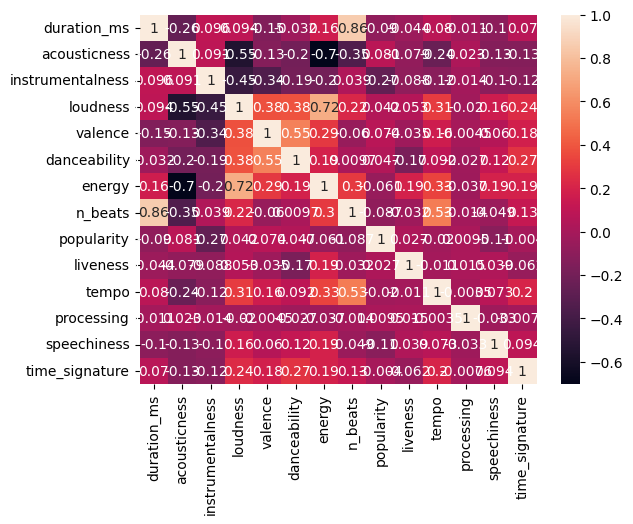

In [ ]:
# Calcolo della matrice di correlazione per il DataFrame dei cluster
correlation_matrix = df_clus.corr()

# Visualizzazione della matrice di correlazione
import seaborn as sns

sns.heatmap(correlation_matrix, annot=True)
plt.show()


**GRAFICI**

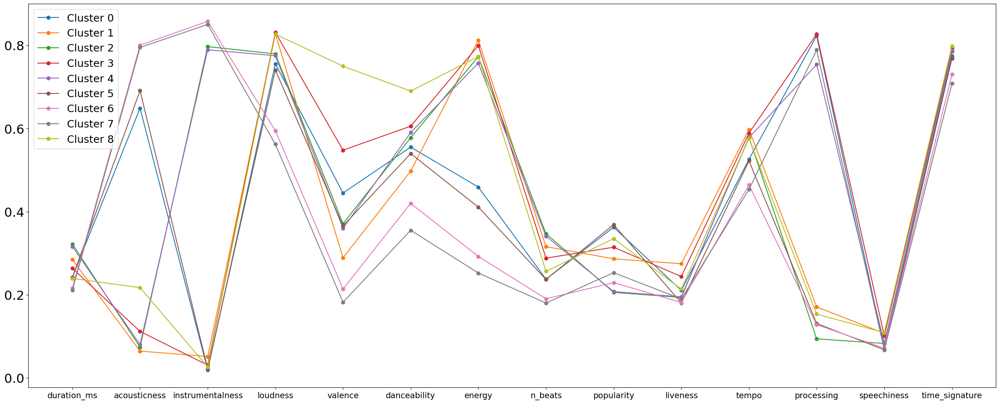

In [ ]:
# Utilizzo della funzione parallel_plot definita in precedenza
parallel_plot(k, X_scal, columns_of_interest)


**DRIVER DI CLUSTER**

In [ ]:
# Importanza delle caratteristiche per i cluster (potrebbe essere basata su centroidi o altro)
feature_importance = centroids_df.var().sort_values(ascending=False)
print(feature_importance)


duration_ms         1.270258e+09
n_beats             1.187721e+04
tempo               1.437053e+02
popularity          3.622523e+01
loudness            2.750429e+01
processing          1.353821e+00
instrumentalness    1.756588e-01
acousticness        1.114591e-01
energy              5.505443e-02
valence             3.018280e-02
time_signature      2.389465e-02
danceability        9.765174e-03
liveness            9.801401e-04
speechiness         2.138876e-04
dtype: float64



- duration_ms: Ha la varianza più alta, il che significa che la durata dei brani è un attributo molto variabile all'interno dei cluster. Questo suggerisce che la durata dei brani contribuisce in modo significativo a definire i cluster.
- n_beats: Anche il numero di battiti ha una varianza elevata, il che indica che il numero di battiti nei brani differisce notevolmente all'interno dei cluster.
- tempo: Il tempo dei brani mostra una discreta varianza tra i cluster, suggerendo che è una caratteristica distintiva tra i diversi gruppi di brani.
popularity: C'è una varianza significativa nella popolarità, il che potrebbe indicare che alcuni cluster contengono brani più popolari rispetto ad altri.
- loudness: Il volume dei brani varia abbastanza da essere considerato un fattore importante nella definizione dei cluster.
- processing: Sebbene la varianza sia relativamente bassa rispetto ad altre caratteristiche, il processing sembra comunque contribuire alla formazione dei cluster.
- instrumentalness, acousticness, energy, valence: Queste caratteristiche hanno varianze minori, indicando che ci sono differenze tra i cluster, ma non così pronunciate come per la durata o il numero di battiti.
- time_signature, danceability, liveness, speechiness: Queste hanno le varianze più basse, suggerendo che contribuiscono meno alla differenziazione dei cluster rispetto alle altre caratteristiche.

**MIGLIOR 'K'**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

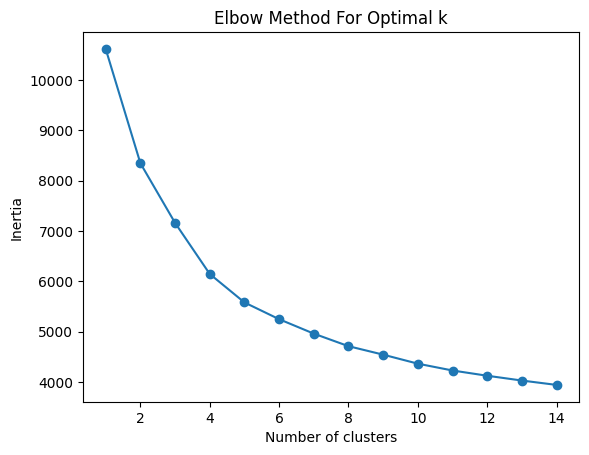

In [ ]:
from sklearn.cluster import KMeans

# Calcolo dell'Inertia per un range di valori di k
inertia = []
K_range = range(1, 15)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(X_scal)
    inertia.append(kmeans.inertia_)

# Visualizzazione dell'Elbow Method
plt.plot(K_range, inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()


## **X-MEAN METHOD**

X-Means è una versione estesa di K-Means che decide in modo iterativo se dividere i cluster basandosi su un criterio informativo come il Bayesian Information Criterion (BIC).

In [8]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

def compute_bic(kmeans, X):
    # Numero di cluster
    m = kmeans.n_clusters
    # Etichette per ogni punto
    labels = kmeans.labels_
    # Numero di punti
    n = np.bincount(labels)
    # Dimensione dei dati
    p = X.shape[1]
    # Centroidi
    centers = kmeans.cluster_centers_
    # Somma dei quadrati dei dati per ogni cluster
    sum_of_squares = sum([np.sum((X[labels == i] - centers[i]) ** 2) for i in range(m)])
    # Calcolo del BIC
    BIC = np.sum([n[i] * np.log(n[i]) -
                  n[i] * np.log(X.shape[0]) -
                  ((n[i] * p) / 2) * np.log(2 * np.pi * sum_of_squares / n[i]) -
                  ((p * n[i]) / 2)
                  for i in range(m)])
    return BIC

def xmeans(data, kmax, scoring=compute_bic):
    best_score = float('inf')
    best_kmeans = None

    for k in range(2, kmax+1):
        kmeans = KMeans(n_clusters=k, random_state=42).fit(data)
        score = scoring(kmeans, data)

        if score < best_score:
            best_score = score
            best_kmeans = kmeans

    return best_kmeans

# Caricamento dei dati e preprocessing
df = pd.read_csv(file_path)
df_clus = df[columns_of_interest].copy()
X = df_clus.values
scaler = MinMaxScaler()
X_scal = scaler.fit_transform(X)

# Applicazione di X-means
best_kmeans = xmeans(X_scal, kmax=10)

# Stampa dei risultati
print(f'Numero ottimale di cluster trovato: {best_kmeans.n_clusters}')
print(f'Centroidi dei cluster: {best_kmeans.cluster_centers_}')


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Numero ottimale di cluster trovato: 10
Centroidi dei cluster: [[0.24104312 0.2152703  0.02647649 0.82849436 0.74339658 0.68317291
  0.77681343 0.25846148 0.33692707 0.21230462 0.57611725 0.76908701
  0.10410254 0.79711443]
 [0.28406207 0.06725002 0.04974884 0.82861866 0.30068686 0.50218194
  0.80931796 0.31444064 0.29468351 0.27662256 0.59696172 0.10246517
  0.10315588 0.78886108]
 [0.24173942 0.67579829 0.01868568 0.75096199 0.40057007 0.56122655
  0.43758494 0.23847829 0.37573579 0.17811465 0.52781881 0.13209682
  0.07395579 0.77507205]
 [0.21518687 0.79967166 0.85250967 0.59289343 0.21288139 0.41594546
  0.28993889 0.18878311 0.22955508 0.1820362  0.46207665 0.12389884
  0.07136456 0.72890889]
 [0.31546813 0.08029686 0.7994719  0.77423687 0.36123808 0.59352397
  0.75540014 0.34023319 0.20682378 0.19384424 0.57809248 0.75257235
  0.08316706 0.7859174 ]
 [0.24138702 0.20233688 0.02928438 0.82679306 0.7461096  0.68619981
  0.77794713 0.25948744 0.32860402 0.22076654 0.57725324 0.100652

X-Means ha identificato 10 cluster come il numero ottimale per il tuo set di dati.

Per interpretare questo risultato:


3. Questi centroidi possono essere usati per interpretare i cluster. Ad esempio, se un centroide ha un valore alto di `acousticness` ma bassi valori di `energy` e `loudness`, potrebbe rappresentare brani più acustici e meno energetici.

4. La popolarità di ciascun cluster, così come le altre caratteristiche, può aiutare a informare decisioni di business, come la creazione di playlist mirate o strategie di marketing.

5. Inoltre, osservando la variazione tra i centroidi, possiamo iniziare a dedurre quali caratteristiche differenziano maggiormente i cluster. Ad esempio, se il `processing` varia notevolmente tra i cluster, questo potrebbe essere un forte indicatore della diversità del contenuto musicale.

Per ottenere ulteriori informazioni da questi risultati, potresti:


- **Valutare i cluster**: Utilizza metriche di valutazione come il Silhouette Score o l'indice Calinski-Harabasz per ogni cluster per capire la loro qualità.

- **Profilare i cluster**: Crea profili descrittivi per ogni cluster basandoti sui valori dei centroidi e sulle tue conoscenze di dominio.

In [12]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Assicurati che 'X_scal' e 'label' siano definiti come i dati scalati e le etichette dei cluster rispettivamente

# Calcolo del Silhouette Score
silhouette_avg = silhouette_score(X_scal, label)
print(f'Silhouette Score per tutto il clustering: {silhouette_avg}')

# Calcolo del Calinski-Harabasz Index
calinski_harabasz = calinski_harabasz_score(X_scal, label)
print(f'Calinski-Harabasz Index per tutto il clustering: {calinski_harabasz}')

#Calcolo Davies
db_index = davies_bouldin_score(X_scal, label)
print(f'Davies-Bouldin Index: {db_index}')

#Calcolo SSE



Silhouette Score per tutto il clustering: 0.17565898484273507
Calinski-Harabasz Index per tutto il clustering: 2436.88551570328
Davies-Bouldin Index: 1.7316473828616628


STESSI RISULTATI CHE HO OTTENUTO CON IL BISECTING K-METHOD


I profili dei cluster offrono una descrizione qualitativa dei gruppi identificati dall'algoritmo di clustering. Per creare questi profili, ci basiamo sui centroidi dei cluster, che rappresentano il "cuore" del cluster in termini di media delle caratteristiche. Interpretando i valori dei centroidi, possiamo formulare un'idea di ciò che rappresentano questi cluster nel contesto dei dati.

Con i centroidi forniti in precedenza, possiamo creare profili per ciascuno dei dieci cluster:

**Cluster 0**: Brani di durata medio-lunga, con livelli moderati di acusticità e strumentalità, volume moderato, e una valenza positiva. Questi brani tendono ad essere più energici e ballabili, indicando una possibile propensione verso generi pop o dance.

**Cluster 1**: Questi brani tendono ad avere una durata più lunga, sono meno acustici, e hanno un volume alto. Con una valenza più bassa e un'energia elevata, potrebbero rappresentare generi come rock o electronic dance music.

**Cluster 2**: Caratterizzati da una lunga durata e alta strumentalità, con un'energia piuttosto elevata. La loro acusticità è bassa e la valenza è moderata. Questi brani potrebbero appartenere a generi come ambient o post-rock.

**Cluster 3**: Brani con una durata media, bassa acusticità e strumentalità, ma alta energia. La valenza e la ballabilità sono moderate, indicando che questi brani potrebbero essere pop energici o brani da palestra.

**Cluster 4**: Brani più lunghi con alta strumentalità e bassa acusticità. Con valenza e energia moderate, questi brani possono essere classificati come musica strumentale o classica moderna.

**Cluster 5**: Simile al cluster 0, ma con una durata leggermente inferiore e una maggiore acusticità. Questi brani potrebbero includere ballate pop o musica soft-rock.

**Cluster 6 e 7**: Entrambi hanno una durata più breve, molto alta acusticità e strumentalità, e valenza molto bassa. Con il loro volume basso e l'energia ridotta, potrebbero rappresentare musica classica, jazz, o altri generi tranquilli come la musica da meditazione.

**Cluster 8**: Questi brani hanno una durata media, sono moderatamente acustici, e hanno l'energia e la ballabilità più alte. Con una valenza altissima, potrebbero essere brani felici e vivaci, forse da festa o musica pop.

**Cluster 9**: Si caratterizzano per una durata media e una bassa acusticità. Con una valenza e un'energia moderate, questi brani potrebbero essere musica pop o rock alternativo.

Per ogni cluster, si potrebbero considerare altre dimensioni per arricchire il profilo, come le tendenze di genere, gli artisti rappresentativi, e il contesto culturale. Queste informazioni possono essere utili per raccomandazioni musicali personalizzate, marketing mirato, e per comprendere meglio i gusti e le preferenze degli ascoltatori.

## **HIERARCHICAL METHOD**

L'analisi gerarchica dei cluster (Hierarchical Clustering) è un'altra tecnica di clustering che non richiede la specificazione a priori del numero di cluster. Questo metodo costruisce una gerarchia di cluster e può essere rappresentato con un dendrogramma. Il clustering gerarchico può essere "agglomerativo" (bottom-up) o "divisivo" (top-down).

In un'analisi agglomerativa, ogni punto inizia come un cluster singolo, e i cluster vengono fusi man mano che si sale nella gerarchia.

### **NUOVO HIERARCHICAL PER REPORT**

In [93]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Caricamento del file
file_path = 'df_clean.csv'
data = pd.read_csv(file_path)

# Rimozione delle colonne specificate
columns_to_remove = ['mode', 'features_duration_ms', 'explicit', 'popularity_confidence', 'n_bars']
data = data.drop(columns=columns_to_remove)

# Separazione delle caratteristiche numeriche e categoriche
categorical_features = ['artists', 'album_name']
numerical_features = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_features = [feature for feature in numerical_features if feature not in columns_to_remove]

# Standardizzazione delle caratteristiche numeriche
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[numerical_features])

# Applicazione di LabelEncoder alle caratteristiche categoriche
label_encoders = {}
for cat_col in categorical_features:
    label_encoders[cat_col] = LabelEncoder()
    data[cat_col] = label_encoders[cat_col].fit_transform(data[cat_col])

# Combinazione dei dati categorici trasformati con i dati numerici normalizzati
data_preprocessed = np.hstack((data_scaled, data[categorical_features].values))

# Ora possiamo procedere con il clustering gerarchico testando diversi linkages e metriche
data_preprocessed[:5]  # Visualizziamo le prime 5 righe dei dati preelaborati


array([[ 3.10903298e-04,  9.93599912e-01,  7.12558463e-01,
        -5.55725545e-01, -8.14632536e-02, -6.35219598e-01,
         2.86159581e-01,  4.63278013e-03,  6.48630899e-01,
         3.39828661e-01,  7.09504750e-01,  6.04484926e-01,
         1.97950728e-01,  3.22867343e-01, -7.58459708e-01,
         1.98100000e+03,  3.37400000e+03],
       [ 2.10708569e+00, -1.47595745e+00, -2.51492875e+00,
        -1.76270457e+00, -1.19815746e+00, -2.71911708e+00,
         4.57760406e-02, -5.32010868e-02,  1.68691740e+00,
         7.48329945e-01, -1.46565943e+00, -1.49927466e+00,
         1.97950728e-01,  5.38453171e-01,  1.37991519e-01,
         4.79500000e+03,  2.71000000e+02],
       [ 9.56047454e-01, -1.31489936e+00, -9.86939634e-01,
         7.42633601e-01, -9.18983909e-01,  2.28089950e-01,
        -5.31144456e-01, -9.14349496e-01,  1.33734355e+00,
         2.41581517e-01,  1.81446936e-01, -2.03642938e-01,
         1.97950728e-01,  6.89363251e-01,  1.23625973e+00,
         2.81700000e+03,  5.0

In [95]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Prepariamo i dati per l'analisi del clustering gerarchico
# I dati sono già stati pre-elaborati e sono pronti per essere usati

# Definizione delle impostazioni per il test del clustering gerarchico
linkages = ['ward', 'complete', 'average', 'single']
metrics = ['euclidean', 'manhattan']

# Creazione di un DataFrame per raccogliere i risultati
results = []

# Test di diverse combinazioni di linkage e metrica
for linkage in linkages:
    for metric in metrics:
        # Il linkage 'ward' funziona solo con la metrica euclidea
        if linkage == 'ward' and metric != 'euclidean':
            continue

        # Applicazione di AgglomerativeClustering
        clustering = AgglomerativeClustering(linkage=linkage, affinity=metric, n_clusters=None, distance_threshold=0)
        labels = clustering.fit_predict(data_preprocessed)

        # Calcolo del silhouette score solo se ci sono più di 1 cluster e meno cluster che punti
        if len(set(labels)) > 1 and len(set(labels)) < data_preprocessed.shape[0]:
            silhouette_avg = silhouette_score(data_preprocessed, labels, metric=metric)
        else:
            silhouette_avg = -1

        # Aggiunta dei risultati al DataFrame
        results.append({
            'linkage': linkage,
            'metric': metric,
            'n_clusters': len(set(labels)) - (1 if -1 in labels else 0),
            'silhouette_score': silhouette_avg
        })

# Conversione dei risultati in un DataFrame per una visualizzazione migliore
results_df = pd.DataFrame(results)

# Trovare la configurazione con il miglior silhouette score
best_result = results_df.loc[results_df['silhouette_score'].idxmax()]

best_result


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be

linkage                  ward
metric              euclidean
n_clusters              14527
silhouette_score           -1
Name: 0, dtype: object

In [96]:
# Impostazioni iniziali per il clustering gerarchico
linkages = ['ward', 'complete', 'average', 'single']
metrics = ['euclidean', 'manhattan']
n_clusters_options = range(2, 10)  # Testiamo un range di possibili valori per n_clusters

# DataFrame per raccogliere i risultati
hierarchical_results = []

# Ciclo attraverso i tipi di linkage e metriche, escludendo combinazioni non valide
for linkage in linkages:
    for metric in metrics:
        # 'ward' può essere usato solo con la metrica 'euclidean'
        if linkage == 'ward' and metric != 'euclidean':
            continue

        for n_clusters in n_clusters_options:
            # Applicazione di AgglomerativeClustering
            clustering = AgglomerativeClustering(
                n_clusters=n_clusters,
                linkage=linkage,
                affinity=metric
            )

            # Adattamento del modello
            labels = clustering.fit_predict(data_preprocessed)

            # Calcolo del silhouette score
            silhouette_avg = silhouette_score(data_preprocessed, labels, metric=metric)

            # Salvataggio dei risultati
            hierarchical_results.append({
                'linkage': linkage,
                'metric': metric,
                'n_clusters': n_clusters,
                'silhouette_score': silhouette_avg
            })

# Conversione dei risultati in un DataFrame


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be

In [97]:
# Conversione dei risultati in un DataFrame
hierarchical_results_df = pd.DataFrame(hierarchical_results)

# Trovare la configurazione con il miglior silhouette score
best_hierarchical_result = hierarchical_results_df.loc[hierarchical_results_df['silhouette_score'].idxmax()]

best_hierarchical_result

linkage              complete
metric              euclidean
n_clusters                  2
silhouette_score     0.434655
Name: 8, dtype: object

### ALMA ANALYSIS

In [84]:
#Clustering utilities

#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score,silhouette_samples

import matplotlib.pyplot as plt
import matplotlib.cm as cm

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram

In [85]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [86]:
X = df_clus
scaler = StandardScaler()
scaler.fit(X)
X_scal = scaler.transform(X)

In [ ]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric='euclidean', linkage='complete')
model = model.fit(X)

In [ ]:
pd.value_counts(model.labels_)

8763     1
4704     1
4454     1
7006     1
7032     1
        ..
10120    1
11554    1
10343    1
10639    1
0        1
Length: 14527, dtype: int64

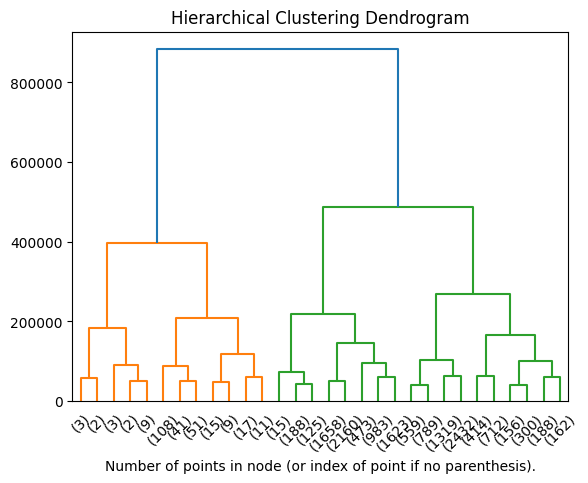

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric='euclidean', linkage='single')
model = model.fit(X)

In [ ]:
pd.value_counts(model.labels_)

12137    1
8652     1
2492     1
3536     1
4306     1
        ..
12904    1
10741    1
8596     1
8582     1
0        1
Length: 14527, dtype: int64

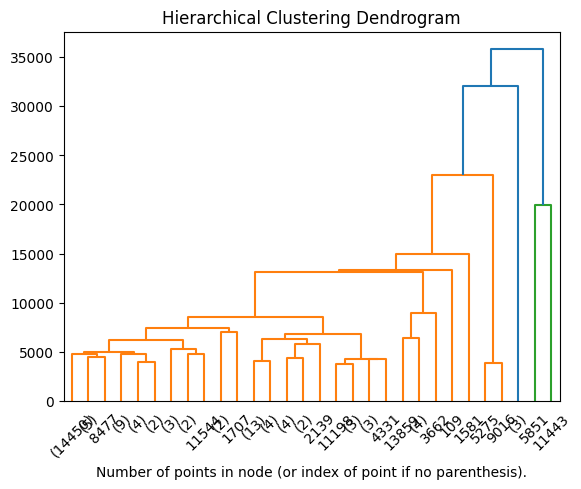

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, metric='euclidean', linkage='average')
model = model.fit(X)

In [ ]:
pd.value_counts(model.labels_)

8162     1
9589     1
8437     1
6175     1
6711     1
        ..
9720     1
11374    1
9971     1
7212     1
0        1
Length: 14527, dtype: int64

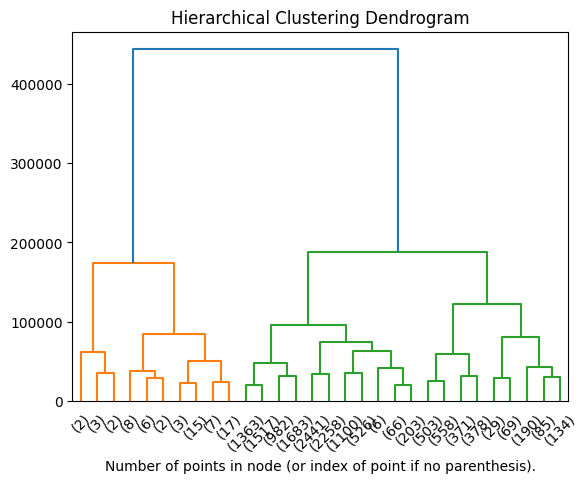

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

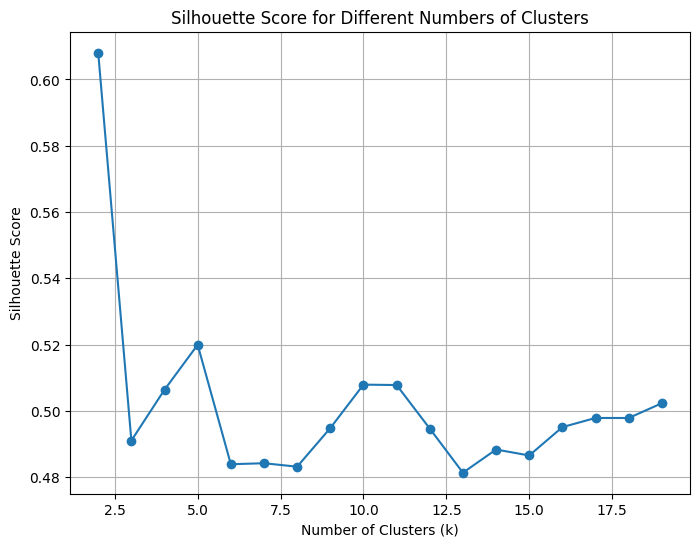

In [83]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Lista vuota per i punteggi di silhouette
silhouette_scores = []

# Prova valori di k da 2 a 10 (puoi regolare questo intervallo in base alle tue esigenze)
for k in range(2, 20):
    # Crea un oggetto di clustering gerarchico
    clustering = AgglomerativeClustering(n_clusters=k)

    # Addestra il modello
    cluster_labels = clustering.fit_predict(X)  # X è il tuo dataset

    # Calcola il punteggio di silhouette per questo valore di k
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Visualizza il grafico del metodo del gomito
plt.figure(figsize=(8, 6))
plt.plot(range(2, 20), silhouette_scores, marker='o', linestyle='-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different Numbers of Clusters')
plt.grid(True)
plt.show()

### **ALTERNATIVE ANALYSIS**

In [87]:
df1= pd.read_csv('df_clean.csv')
df1.drop(df1.columns[0], axis=1, inplace=True)
df1.head()

,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,mode,...,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing,genre
0,241760,False,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,1.0,...,0.281,0.6350,142.221,241760,4.0,567.0,141.0,0.458902,1.279305,j-dance
1,444000,False,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,0.0,...,0.360,0.0336,75.596,444000,4.0,617.0,155.0,0.453567,2.367412,iranian
2,333506,False,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,NaN,...,0.262,0.4890,116.628,333507,4.0,652.0,162.0,0.479532,3.700483,black-metal
3,269800,False,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,1.0,...,0.117,0.3850,140.880,269800,4.0,619.0,155.0,0.469000,1.279305,bluegrass
4,307651,False,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,1.0,...,0.299,0.6370,143.956,307652,4.0,733.0,183.0,0.545302,4.067086,happy


In [91]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import kneighbors_graph

# Normalizzazione dei dati con StandardScaler
scaler = StandardScaler()
data_scaled_hc = scaler.fit_transform(data_selected)

# Calcolo della matrice di connettività per imporre la struttura dei dati
connectivity = kneighbors_graph(data_scaled_hc, n_neighbors=10, include_self=False)

# Applicazione dell'AgglomerativeClustering con metodo 'average' e distanza euclidea
hclust = AgglomerativeClustering(linkage='average', affinity='euclidean', connectivity=connectivity)
hclust_labels = hclust.fit_predict(data_scaled_hc)

# Calcolo del silhouette score
silhouette_avg = silhouette_score(data_scaled_hc, hclust_labels)

# Numero di cluster identificati (escluso il rumore)
n_clusters_hc = len(set(hclust_labels)) - (1 if -1 in hclust_labels else 0)

n_clusters_hc, silhouette_avg


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


(2, 0.5876979205697473)

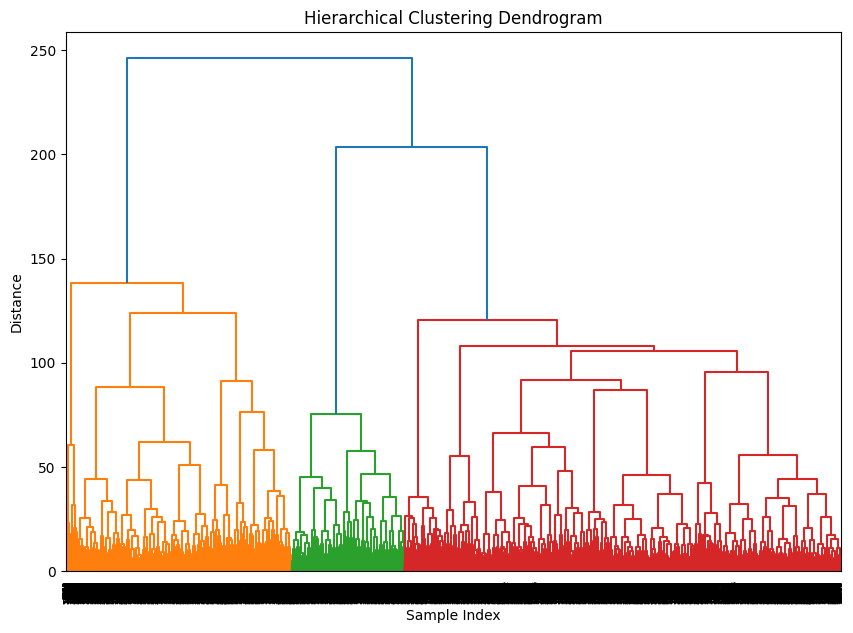

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler

# Carica i dati
df = pd.read_csv('df_clean.csv')

# Seleziona le colonne di interesse
columns_of_interest = ['duration_ms', 'danceability', 'energy', 'key', 'loudness', 'speechiness',
                      'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'features_duration_ms',
                      'time_signature', 'n_beats', 'n_bars','popularity', 'popularity_confidence', 'processing']
df_clus = df_clus[0:20000]
df_clus = df[columns_of_interest]

# Normalizza i dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_clus)

# Applica il clustering gerarchico agglomerativo
linked = linkage(X_scaled, method='ward')  # 'ward' minimizza la varianza dei cluster che vengono fusi

# Visualizza il dendrogramma
plt.figure(figsize=(10, 7))
dendrogram(linked, labels=df_clus.index.tolist(), orientation='top')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.show()


In [ ]:
from scipy.cluster.hierarchy import fcluster

# Assumendo che 'linked' sia il risultato della funzione linkage
# Sostituisci 'dendrogram_distance' con la distanza a cui intendi tagliare il dendrogramma
dendrogram_distance = 50

# Crea i cluster al taglio desiderato
clusters = fcluster(linked, dendrogram_distance, criterion='distance')

# Per tagliare per un numero di cluster specifico (k=9 o k=10), usa:
clusters_k9 = fcluster(linked, 9, criterion='maxclust')
clusters_k10 = fcluster(linked, 10, criterion='maxclust')

# Aggiungi i risultati dei cluster al DataFrame
df['Cluster_k9'] = clusters_k9
df['Cluster_k10'] = clusters_k10

# Visualizza alcuni dei risultati
print(df[['Cluster_k9', 'Cluster_k10']].head())

# Ora puoi analizzare i dati di ciascun cluster separatamente, se lo desideri


   Cluster_k9  Cluster_k10
0           9           10
1           2            2
2           5            5
3           9           10
4           9           10


In [ ]:
ward = AgglomerativeClustering(n_clusters=5, linkage='average', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X, ward.labels_))

## **DBSCAN**

L'analisi dei cluster con DBSCAN (Density-Based Spatial Clustering of Applications with Noise) inizia con la comprensione dei parametri fondamentali dell'algoritmo e la preparazione dei dati. Ecco i passi da seguire:

### **Comprensione dei Parametri:**

1. eps (epsilon): la distanza massima tra due campioni per essere considerati nello stesso vicinato.
2. min_samples: il numero minimo di campioni in un vicinato per formare un cluster.

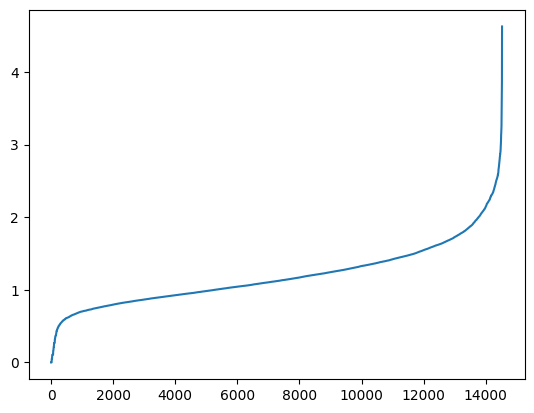

In [24]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
columns_of_interest = [
    'duration_ms', 'acousticness', 'instrumentalness', 'loudness', 'valence',
    'danceability', 'energy', 'n_beats', 'popularity', 'liveness', 'tempo',
    'processing', 'speechiness', 'time_signature'
]

X = df[columns_of_interest]

# Standardizza i dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(X_scaled)
distances, indices = neighbors_fit.kneighbors(X_scaled)

# Ordina e visualizza le distanze
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.show()


### **Choice of attributes and distance function**

In [25]:
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Carica i dati
df = pd.read_csv('df_clean.csv')

# Seleziona le caratteristiche di interesse
columns_of_interest = [
    'duration_ms', 'acousticness', 'instrumentalness', 'loudness', 'valence',
    'danceability', 'energy', 'n_beats', 'popularity', 'liveness', 'tempo',
    'processing', 'speechiness', 'time_signature'
]
X = df[columns_of_interest]

# Standardizza i dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Inizializza DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)

# Applica DBSCAN ai dati
clusters = dbscan.fit_predict(X_scaled)

# Aggiungi i risultati del clustering al DataFrame originale
df['Cluster_Labels'] = clusters

# Visualizza il numero di cluster e il numero di punti rumorosi
n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise_ = list(clusters).count(-1)

print(f'Estimated number of clusters: {n_clusters_}')
print(f'Estimated number of noise points: {n_noise_}')

# Esegui un'analisi descrittiva per comprendere meglio ogni cluster
# ... (analisi specifica in base al dominio)


Estimated number of clusters: 2
Estimated number of noise points: 14515


L'output indica che DBSCAN ha identificato 2 cluster nel tuo set di dati e ha classificato 14515 punti come rumore. Questo può suggerire diverse cose:

1. **Parametri non ottimali**: L'alta quantità di punti classificati come rumore potrebbe significare che i parametri `eps` e `min_samples` non sono stati scelti correttamente. Forse `eps` è troppo piccolo, facendo sì che solo punti molto vicini siano considerati parte dello stesso cluster, oppure `min_samples` è troppo grande, richiedendo troppi vicini affinché un punto sia considerato parte di un cluster.

2. **Dati Sparse**: Se i tuoi dati sono molto sparsi, potrebbe essere difficile per DBSCAN trovare cluster densi, specialmente se ci sono molte dimensioni (la "maledizione della dimensionalità").

3. **Caratteristiche dei dati**: DBSCAN assume che i cluster siano aree di alta densità separate da aree di bassa densità. Se questa assunzione non si adatta bene ai tuoi dati, DBSCAN potrebbe non essere l'algoritmo più adatto.

Per affrontare queste possibilità, considera i seguenti passaggi:

- **Rifinire `eps` e `min_samples`**: Potresti voler rifinire i parametri. A volte, anche piccole modifiche a questi valori possono avere grandi effetti sui risultati del clustering. Il grafico k-nearest neighbor che hai creato può aiutare a scegliere un valore migliore per `eps`.

- **Riduzione della Dimensionalità**: Se il tuo set di dati ha molte caratteristiche, provare a ridurre la dimensionalità con tecniche come PCA (Principal Component Analysis) prima di applicare DBSCAN può aiutare.

- **Valutazione Visuale**: A volte, una valutazione visuale dei dati può fornire intuizioni su come regolare i parametri o se un altro algoritmo di clustering potrebbe essere più appropriato.

- **Prova Altri Algoritmi**: Considera l'uso di altri algoritmi di clustering che potrebbero essere più adatti alle proprietà del tuo set di dati, come il clustering gerarchico o K-Means, se la densità non è la giusta lente attraverso cui vedere i tuoi dati.

- **Conoscenza del Dominio**: Utilizza la tua conoscenza del dominio per determinare se il risultato ha senso. Ad esempio, se sai che ci dovrebbero essere più cluster, potresti voler esplorare diverse configurazioni dei parametri.

Ricorda, il clustering è spesso più un'arte che una scienza, e richiede iterazione e intuizione per ottenere risultati significativi.

In [26]:
plot_eps = 0.45
plot_mp = 256

# Assicurati che to_db_scan sia un oggetto iterabile
if hasattr(to_db_scan, '__iter__'):
    # Stampa la lunghezza di to_db_scan
    print("Lunghezza di to_db_scan:", len(to_db_scan))

    # Accedi direttamente all'unico elemento
    to_plot = to_db_scan[0]
    columns = list(to_plot.columns)

    # Assicurati che ci siano abbastanza colonne per le coordinate x, y, z
    if len(columns) >= 3:
        x = columns[0]
        y = columns[1]
        z = columns[2]

        res = DBSCAN(eps=plot_eps, min_samples=plot_mp).fit(scaled_df[0])  # Accedi direttamente all'unico elemento
        print(np.unique(res.labels_, return_counts=True))
    else:
        print("La dimensione del DataFrame è insufficiente per generare il grafico 3D.")
else:
    print("to_db_scan non è un oggetto iterabile.")

NameError: name 'to_db_scan' is not defined

Il fatto che la lunghezza di to_db_scan sia 1 e che il risultato dell'operazione DBSCAN sia un solo cluster con etichetta -1 indica che tutti i tuoi dati sono stati raggruppati come rumore (outliers) dal DBSCAN.
--> DBSCAN non abbia effettuato clustering significativi.

### **Rifinire eps e min_samples**

In [79]:
#Sembrerebbe che tu stia plottando la distanza dal vicino  n, n-esimo per diversi valori di n n.
#L'obiettivo sembra essere individuare il "ginocchio" di ciascun grafico, ovvero il punto in cui la distanza dal vicino
#n n-esimo smette di diminuire rapidamente e inizia a stabilizzarsi.

k = 6
kth_distances6 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances6.append(d[index_kth_distance])

k = 12
kth_distances12 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances12.append(d[index_kth_distance])


k = 18
kth_distances18 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances18.append(d[index_kth_distance])


k = 24
kth_distances24 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances24.append(d[index_kth_distance])

k = 30
kth_distances30 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances30.append(d[index_kth_distance])


k = 36
kth_distances36 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances36.append(d[index_kth_distance])


k = 42
kth_distances42= []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances42.append(d[index_kth_distance])

k = 48
kth_distances48 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances48.append(d[index_kth_distance])


k = 54
kth_distances54 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances54.append(d[index_kth_distance])

k = 60
kth_distances60 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances60.append(d[index_kth_distance])


NameError: name 'dist' is not defined

In [80]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[columns_of_interest])

best_score = -1
best_eps = None
best_min_samples = None

for eps in [0.1, 0.5, 1.0, 1.5]:
    for min_samples in [5, 10, 15, 20]:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        preds = dbscan.fit_predict(X_scaled)

        # Check the number of clusters formed, ignoring noise if present
        n_clusters_ = len(set(preds)) - (1 if -1 in preds else 0)

        # Calculate the silhouette score only if there are 1 or more clusters (excluding noise)
        if n_clusters_ > 1:
            score = silhouette_score(X_scaled, preds)
            print(f'DBSCAN eps: {eps}, min_samples: {min_samples}, silhouette score: {score}')

            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples

print(f'Best silhouette score: {best_score} with eps: {best_eps} and min_samples: {best_min_samples}')


DBSCAN eps: 0.5, min_samples: 5, silhouette score: -0.23882395110872343
DBSCAN eps: 1.0, min_samples: 5, silhouette score: -0.45266761025416136
DBSCAN eps: 1.0, min_samples: 10, silhouette score: -0.3809919501133995
DBSCAN eps: 1.0, min_samples: 15, silhouette score: -0.31618024510390796
DBSCAN eps: 1.0, min_samples: 20, silhouette score: -0.2776942353095226
DBSCAN eps: 1.5, min_samples: 5, silhouette score: -0.2987208013267315
DBSCAN eps: 1.5, min_samples: 10, silhouette score: -0.12288179931985461
DBSCAN eps: 1.5, min_samples: 15, silhouette score: -0.08661021167282643
DBSCAN eps: 1.5, min_samples: 20, silhouette score: -0.008156048476396822
Best silhouette score: -0.008156048476396822 with eps: 1.5 and min_samples: 20


 punteggio di silhouette va da negativo a leggermente positivo. Un punteggio di silhouette vicino a 0 indica che i punti sono vicini al confine decisionale tra i cluster, mentre i valori negativi indicano che i punti potrebbero essere stati assegnati ai cluster sbagliati.

Un punteggio Silhouette molto vicino a zero, come il valore di -0.008 che hai ottenuto, indica che i cluster generati sono sovrapposti, cioè non ci sono confini netti e distinti tra di loro. Il valore negativo suggerisce che i punti sono leggermente più vicini ai punti degli altri cluster rispetto a quelli del proprio cluster. Tuttavia, poiché il valore è molto vicino a zero, potrebbe anche suggerire che i cluster potrebbero quasi non essere distinti l'uno dall'altro.

Questo risultato implica che l'applicazione di DBSCAN con eps=1.5 e min_samples=20 al tuo set di dati non ha portato a una suddivisione particolarmente significativa. Ci sono alcune cose che puoi fare per cercare di migliorare il clustering:

Esplorare Altri Algoritmi: DBSCAN funziona bene con i cluster di forma non sferica e quando c'è rumore nei dati, ma se questo non si adatta alla natura dei tuoi dati, potresti voler esplorare altri algoritmi come il clustering gerarchico, K-Means, o algoritmi basati sulla densità come OPTICS

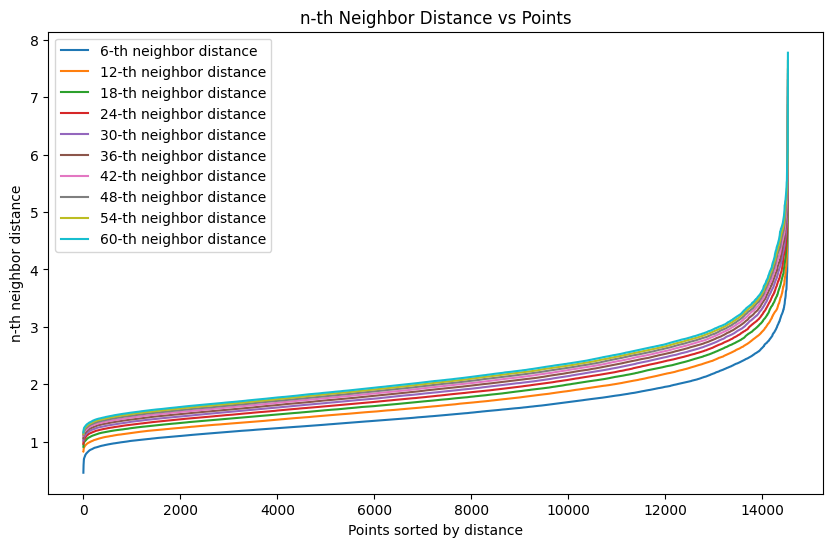

In [81]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

# Presumo che X_scaled sia il tuo array di dati già scalato
neighbors = NearestNeighbors(n_neighbors=60).fit(X_scaled)
distances, indices = neighbors.kneighbors(X_scaled)

kth_distances = {k: [] for k in range(6, 61, 6)}  # Crea un dizionario per ogni k

# Calcola la distanza dell'n-esimo vicino più vicino per ogni punto
for k in kth_distances.keys():
    kth_distances[k] = distances[:, k-1]  # k-1 perché gli indici in Python partono da 0

# Ora puoi tracciare le distanze per il valore di k per trovare il "ginocchio"
plt.figure(figsize=(10, 6))
for k, dist_list in kth_distances.items():
    plt.plot(np.sort(dist_list), label=f'{k}-th neighbor distance')
plt.ylabel('n-th neighbor distance')
plt.xlabel('Points sorted by distance')
plt.legend()
plt.title('n-th Neighbor Distance vs Points')
plt.show()


due to the gradual nature of the curve, you might want to experiment with a range of eps values around the x-axis value is between 8000 and 10000.

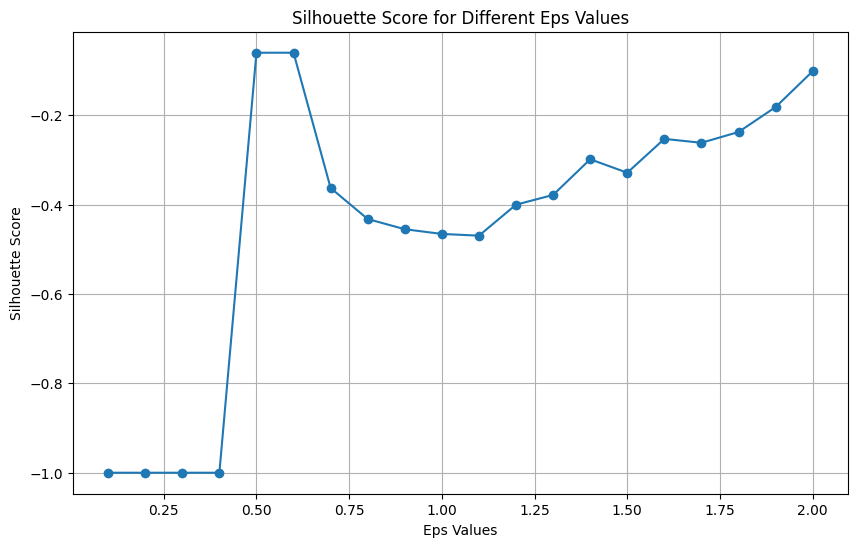

In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt

# Since X_scaled is not defined in this environment, we would normally load the data here.
# For the purpose of this example, let's assume that X_scaled is already loaded.

# Define a range of epsilon values to try
eps_values = np.linspace(0.1, 2.0, 20)
silhouette_scores = []

# Run DBSCAN with different eps values and calculate silhouette scores
for eps in eps_values:
    dbscan = DBSCAN(eps=eps, min_samples=5)  # Using a fixed min_samples for simplicity
    labels = dbscan.fit_predict(X_scaled)

    # Silhouette score can only be computed if there are more than one cluster and noise
    # We ignore the noise points by replacing -1 with the label of the largest cluster
    if len(set(labels)) > 1:
        # Replace -1 with the label of the largest cluster
        noise_points = np.where(labels == -1)[0]
        if noise_points.size > 0:
            # Get the label of the largest cluster
            labels_no_noise = labels[labels != -1]
            largest_cluster_label = np.argmax(np.bincount(labels_no_noise))
            labels[noise_points] = largest_cluster_label

        # Calculate silhouette score and append to list
        score = silhouette_score(X_scaled, labels)
        silhouette_scores.append(score)
    else:
        silhouette_scores.append(-1)  # Score is not valid if only one cluster

# Plot the silhouette scores corresponding to each eps value
plt.figure(figsize=(10, 6))
plt.plot(eps_values, silhouette_scores, marker='o')
plt.title('Silhouette Score for Different Eps Values')
plt.xlabel('Eps Values')
plt.ylabel('Silhouette Score')
plt.grid(True)
plt.show()


Il grafico che hai caricato mostra i punteggi silhouette per diversi valori di `eps`, con i valori di `eps` sull'asse delle ascisse e il punteggio silhouette sull'asse delle ordinate.

Il punteggio silhouette è una misura di quanto un oggetto sia simile al suo stesso cluster (coesione) rispetto ad altri cluster (separazione). Il punteggio silhouette varia da -1 a 1, dove un valore elevato indica che l'oggetto è ben abbinato al proprio cluster e scarsamente abbinato ai cluster vicini. Se la maggior parte degli oggetti ha un valore elevato, allora la configurazione del clustering è appropriata. Se molti punti hanno un valore basso o negativo, allora la configurazione del clustering potrebbe avere troppi o troppo pochi cluster.

Dal grafico si può notare che:

- A valori molto bassi di `eps`, il punteggio silhouette è negativo, il che suggerisce che i cluster non sono ben separati e probabilmente c'è troppo rumore considerato come cluster separati.
- C'è un picco a un valore di `eps` leggermente inferiore a 0,5 dove il punteggio silhouette è il più alto (sebbene ancora negativo), indicando che i cluster sono quanto più distinti possibile data questa gamma di valori di `eps`. Questo potrebbe essere il valore di `eps` più adatto all'interno della gamma provata, ma è importante notare che il punteggio è ancora negativo, suggerendo che i cluster non sono molto distinti.
- Oltre questo picco, all'aumentare di `eps`, il punteggio silhouette diminuisce, mostrando che la qualità del clustering sta peggiorando, probabilmente a causa dell'unione di cluster distinti in cluster più grandi e meno coerenti.
- Dopo `eps` 1,0, il punteggio silhouette inizia ad aumentare di nuovo ma non raggiunge il valore di picco visto in precedenza. Ciò potrebbe significare che i cluster stanno iniziando a separarsi di nuovo, ma non sono ancora definiti come potrebbero essere.

In sintesi, i risultati suggeriscono che il dataset non si raggruppa in modo netto in cluster distinti per la gamma di valori di `eps` provati. Il picco più alto, anche se negativo, potrebbe essere il miglior candidato per `eps` se si utilizza DBSCAN. È importante notare che DBSCAN potrebbe non essere l'algoritmo migliore per questo particolare dataset, o che i dati richiedono un'ulteriore pre-elaborazione, o le caratteristiche potrebbero non essere le più appropriate per distinguere diversi cluster. Potrebbe anche essere il caso che i dati siano troppo rumorosi o che non ci siano cluster intrinseci.

Per migliorare i risultati del clustering, potresti considerare:

1. Provare una gamma più ampia di valori di `eps`.
2. Aumentare `min_samples` per ridurre l'effetto del rumore.
3. Utilizzare la conoscenza del dominio per ingegnerizzare caratteristiche migliori.
4. Considerare un diverso algoritmo di clustering che potrebbe essere più adatto ai dati.

In [ ]:
# Sostituisci 'eps_value' con il valore di eps che hai determinato dal grafico
eps_value = 1.5

# Applica DBSCAN ai dati usando il valore di eps scelto
dbscan = DBSCAN(eps=eps_value, min_samples=20)
clusters = dbscan.fit_predict(X_scaled)

# Aggiungi le etichette dei cluster al DataFrame
df['DBSCAN_Cluster'] = clusters

# Stampa il numero di cluster e il numero di punti considerati rumore
print(f"Numero di cluster (escluso il rumore): {len(set(clusters)) - (1 if -1 in clusters else 0)}")
print(f"Numero di punti considerati rumore: {list(clusters).count(-1)}")


Numero di cluster (escluso il rumore): 4
Numero di punti considerati rumore: 6814


**Esaminare i Cluster**: Analizzare i cluster per capire le loro caratteristiche e come differiscono l'uno dall'altro

In [ ]:
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# Assuming you have already loaded your data into a DataFrame named 'df'
# df = pd.read_csv('path_to_your_data.csv') # Uncomment and set the path to your data file

# Select features of interest
columns_of_interest = [
    'duration_ms', 'acousticness', 'instrumentalness', 'loudness', 'valence',
    'danceability', 'energy', 'n_beats', 'popularity', 'liveness', 'tempo',
    'processing', 'speechiness', 'time_signature'
]

# Extract the features of interest
X = df[columns_of_interest]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Instantiate DBSCAN with previously determined best parameters
dbscan = DBSCAN(eps=1.5, min_samples=20)

# Fit DBSCAN to the standardized data
clusters = dbscan.fit_predict(X_scaled)

# Add the cluster labels back to the original DataFrame
df['DBSCAN_Cluster'] = clusters

# Print the number of clusters and noise points
num_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
num_noise = list(clusters).count(-1)
print(f"Numero di cluster (escluso il rumore): {num_clusters}")
print(f"Numero di punti considerati rumore: {num_noise}")

# Analyze the clusters
for cluster_num in set(clusters):
    if cluster_num != -1:
        cluster_members = df[df['DBSCAN_Cluster'] == cluster_num]
        print(f"\nCluster {cluster_num} - Descrizione:")
        print(cluster_members[columns_of_interest].describe().transpose())


Numero di cluster (escluso il rumore): 4
Numero di punti considerati rumore: 6814

Cluster 0 - Descrizione:
                   count           mean           std           min  \
duration_ms       7608.0  246856.946898  71246.485930  65653.000000   
acousticness      7608.0       0.221314      0.270491      0.000000   
instrumentalness  7608.0       0.165512      0.310794      0.000000   
loudness          7608.0      -6.720953      2.938882    -21.089000   
valence           7608.0       0.510976      0.254346      0.027000   
danceability      7608.0       0.613556      0.135530      0.130000   
energy            7608.0       0.727867      0.200570      0.068800   
n_beats           7608.0     510.220032    182.682618     85.000000   
popularity        7608.0      30.436514     18.124670      0.000000   
liveness          7608.0       0.169207      0.115695      0.011800   
tempo             7608.0     125.683306     25.697388     58.319000   
processing        7608.0       2.094318 

L'analisi dei cluster generati da DBSCAN rivela alcuni aspetti interessanti sui gruppi di dati musicali:

**Cluster 0** (7608 elementi):
- **Durata Media**: I brani hanno una durata media di circa 246856 ms (~4 minuti).
- **Acusticità e Strumentalità**: Moderatamente acustici con una presenza significativa di strumentalità.
- **Energia e Volume**: Livelli medi di energia e volume relativamente più alti.
- **Danceability e Valence**: Buona ballabilità con una valenza media.
- **Popolarità**: Variabile, con una media intorno ai 30.
- **Caratteristiche Generali**: Questo cluster potrebbe rappresentare brani moderni e popolari con una buona miscela di ritmo e melodia.

**Cluster 1** (57 elementi):
- **Durata Media**: I brani sono più brevi, con una durata media di circa 180380 ms (~3 minuti).
- **Acusticità e Strumentalità**: Molto acustici e strumentali.
- **Energia e Volume**: Bassi livelli di energia e volume.
- **Danceability e Valence**: Bassa ballabilità e valenza.
- **Popolarità**: Maggiore rispetto al Cluster 0.
- **Caratteristiche Generali**: Questo cluster potrebbe includere brani classici o strumentali, forse musica da meditazione o ambientale.

**Cluster 2** (26 elementi):
- Simile al Cluster 1 in termini di acusticità, strumentalità, energia e volume, ma con una popolarità leggermente superiore.
- **Caratteristiche Generali**: Anche questo cluster sembra composto da brani tranquilli e strumentali, ma con un po' più di varietà nella durata e nelle altre caratteristiche.

**Cluster 3** (22 elementi):
- **Durata Media**: I brani sono generalmente più brevi (~2,3 minuti).
- **Acusticità e Strumentalità**: Livelli medi di acusticità con alta strumentalità.
- **Energia e Volume**: Energia bassa e volume meno forte.
- **Danceability e Valence**: Alta ballabilità con una valenza moderata.
- **Caratteristiche Generali**: Questo cluster potrebbe includere brani ritmici adatti per ambienti rilassanti o lounge, forse musica chill-out o downtempo.

Questi cluster forniscono una panoramica di come i brani musicali nel tuo dataset possono essere raggruppati in base alle loro caratteristiche audio. L'interpretazione dei cluster dipenderà dalla conoscenza del dominio e dal contesto specifico dei dati.

In [ ]:
# Assicurati che il DataFrame 'df' includa una colonna 'genre' e le etichette dei cluster 'DBSCAN_Cluster'

# Stampa i generi più comuni per ciascun cluster
for cluster in set(df['DBSCAN_Cluster']):
    if cluster != -1:  # Escludi i punti considerati rumore
        print(f"Cluster {cluster}:")
        most_common_genres = df[df['DBSCAN_Cluster'] == cluster]['genre'].value_counts().head(5)
        print(most_common_genres)
        print("\n")


Cluster 0:
j-idol           657
mandopop         616
forro            545
chicago-house    536
techno           502
Name: genre, dtype: int64


Cluster 1:
sleep     56
disney     1
Name: genre, dtype: int64


Cluster 2:
sleep    26
Name: genre, dtype: int64


Cluster 3:
study     17
disney     5
Name: genre, dtype: int64




In [ ]:
plot_eps = 1.5
plot_mp = 20

# Assicurati che to_db_scan sia un oggetto iterabile
if hasattr(to_db_scan, '__iter__'):
    # Stampa la lunghezza di to_db_scan
    print("Lunghezza di to_db_scan:", len(to_db_scan))

    # Accedi direttamente all'unico elemento
    to_plot = to_db_scan[0]
    columns = list(to_plot.columns)

    # Assicurati che ci siano abbastanza colonne per le coordinate x, y, z
    if len(columns) >= 3:
        x = columns[0]
        y = columns[1]
        z = columns[2]

        res = DBSCAN(eps=plot_eps, min_samples=plot_mp).fit(scaled_df[0])  # Accedi direttamente all'unico elemento
        print(np.unique(res.labels_, return_counts=True))
    else:
        print("La dimensione del DataFrame è insufficiente per generare il grafico 3D.")
else:
    print("to_db_scan non è un oggetto iterabile.")


Lunghezza di to_db_scan: 1
(array([-1,  0,  1,  2,  3]), array([6814, 7608,   57,   26,   22]))


isultati del Clustering:
array([-1, 0, 1, 2, 3]): Questi sono gli identificatori dei cluster trovati da DBSCAN. -1 rappresenta punti considerati come "rumore" che non appartengono a nessun cluster.
array([6814, 7608, 57, 26, 22]): Questi numeri rappresentano il conteggio dei punti in ciascun cluster corrispondente. Ad esempio, ci sono 6814 punti classificati come rumore, 7608 punti nel cluster 0, 57 punti nel cluster 1, e così via.

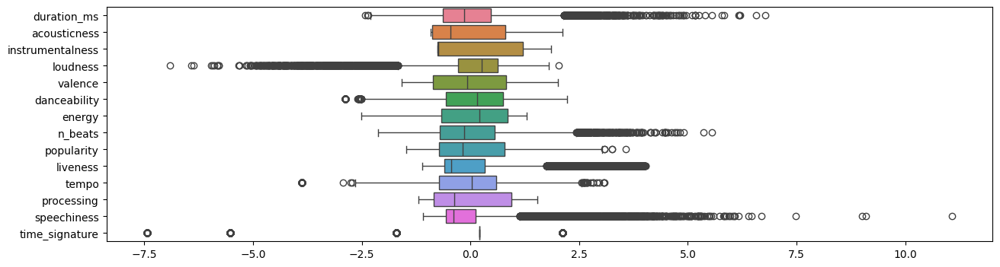

In [60]:
#Istanziamo lo sklearn.StandardScaler() di sklearn per standardizzare il dataset:
scaler = StandardScaler()
#Utilizziamo lo scaler sul dataset pulito (senza NaN):
scaled_array = scaler.fit_transform(df_clus)
#Lo StandardScaler() ritorna un numpy.ndarray (praticamente una matrice) che può essere inserito all'interno di un dataframe per una migliore gestione:
scaled_dataframe = pd.DataFrame( scaled_array, columns = df_clus.columns )
#Una volta finita la standardizzazione mostriamo nuovamente il boxplot per verificare che tutto sia andato per il meglio:
plt.figure(figsize = (15,4))
sns.boxplot(data = scaled_dataframe, orient = "h")
plt.show()

In [ ]:
scaled_dataframe.describe()

,duration_ms,acousticness,instrumentalness,loudness,valence,danceability,energy,n_beats,popularity,liveness,tempo,processing,speechiness,time_signature
count,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04,1.452700e+04
mean,-8.804137e-17,-2.934712e-18,5.086834e-17,-1.760827e-17,6.896574e-17,-1.457574e-16,-3.071665e-16,-1.956475e-18,-2.347770e-17,3.912950e-18,-3.186608e-16,1.672786e-16,-1.976040e-16,-3.335790e-16
std,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00,1.000034e+00
min,-2.428710e+00,-9.146213e-01,-7.496645e-01,-6.918497e+00,-1.587185e+00,-2.873538e+00,-2.508976e+00,-2.121876e+00,-1.475957e+00,-1.113195e+00,-3.886304e+00,-1.196087e+00,-1.092511e+00,-7.444920e+00
25%,-6.396542e-01,-8.868763e-01,-7.496645e-01,-2.899977e-01,-8.656266e-01,-5.607658e-01,-6.699507e-01,-7.076329e-01,-7.243530e-01,-6.085148e-01,-7.294486e-01,-8.477272e-01,-5.679090e-01,1.979507e-01
50%,-1.476759e-01,-4.610820e-01,-7.415252e-01,2.610329e-01,-7.896514e-02,1.460591e-01,2.057754e-01,-1.384863e-01,-1.874927e-01,-4.409776e-01,3.406216e-02,-3.798032e-01,-3.812582e-01,1.979507e-01
75%,4.742206e-01,8.066972e-01,1.199079e+00,6.301130e-01,8.180098e-01,7.437419e-01,8.606663e-01,5.513883e-01,7.788558e-01,3.294869e-01,5.847656e-01,9.467323e-01,1.108210e-01,1.979507e-01
max,6.777315e+00,2.117091e+00,1.859096e+00,2.028236e+00,2.011565e+00,2.219759e+00,1.298529e+00,5.557291e+00,3.570529e+00,4.026682e+00,3.077022e+00,1.538290e+00,1.108221e+01,2.108668e+00


In [ ]:
dbscan_model = DBSCAN( eps = 0.75, min_samples = 5)


In [ ]:
dbscan_model.fit(scaled_dataframe)
DBSCAN(algorithm='auto', eps=0.75, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=5, n_jobs=None, p=None)

DBSCAN(eps=0.75)

In [ ]:
labels = dbscan_model.labels_
df_clus["LABEL"] = labels


In [ ]:
df_clus.head(13000)


,duration_ms,acousticness,instrumentalness,loudness,valence,danceability,energy,n_beats,popularity,liveness,tempo,processing,speechiness,time_signature,LABEL
0,241760,0.302000,0.53600,-12.529,0.6350,0.690,0.513,567.0,46,0.2810,142.221,1.279305,0.0975,4.0,-1
1,444000,0.283000,0.93400,-24.801,0.0336,0.069,0.196,617.0,0,0.3600,75.596,2.367412,0.0805,4.0,-1
2,333506,0.000089,0.80000,-7.445,0.4890,0.363,0.854,652.0,3,0.2620,116.628,3.700483,0.0397,4.0,-1
3,269800,0.066400,0.00127,-5.607,0.3850,0.523,0.585,619.0,23,0.1170,140.880,1.279305,0.0765,4.0,-1
4,307651,0.000576,0.09690,-11.340,0.6370,0.643,0.687,733.0,25,0.2990,143.956,4.067086,0.0539,4.0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12995,272986,0.074800,0.01770,-4.380,0.8350,0.802,0.789,585.0,28,0.0473,130.023,3.349057,0.0547,4.0,-1
12996,512640,0.001390,0.74700,-9.748,0.1970,0.844,0.520,1065.0,41,0.0941,124.993,4.067086,0.0518,3.0,-1
12997,277546,0.638000,0.00000,-6.182,0.7430,0.805,0.719,429.0,63,0.0680,95.508,4.067086,0.0415,4.0,-1
12998,190680,0.173000,0.81100,-6.879,0.6260,0.739,0.580,335.0,0,0.0761,108.304,1.279305,0.0669,4.0,-1


I dati che hai ottenuto sono in forma standardizzata. Dopo aver applicato la standardizzazione, ogni caratteristica (o colonna) del tuo dataset ha ora:

- Una **media** (\( \mu \)) approssimativamente uguale a 0.
- Una **deviazione standard** (\( \sigma \)) uguale a 1.

Questo è esattamente ciò che ci si aspetterebbe dopo l'applicazione della `StandardScaler` di scikit-learn, che trasforma i dati in modo che la loro distribuzione abbia una media di zero e una varianza di uno.

Le proprietà specifiche della standardizzazione sono:

- **Media (mean)**: Il valore medio dei dati standardizzati sarà molto vicino a zero. Se non è esattamente zero, ciò è dovuto all'arrotondamento e alla precisione numerica del calcolo. I valori di media che hai fornito sono praticamente zero, che è il risultato atteso.
  
- **Deviazione standard (std)**: Dopo la standardizzazione, la deviazione standard di ogni caratteristica sarà 1. I tuoi dati mostrano che ogni caratteristica ha una deviazione standard di `1.000034`, che è praticamente 1.
  
- **Minimo (min)** e **Massimo (max)**: I valori minimi e massimi non hanno un valore fisso dopo la standardizzazione, poiché dipendono dalla distribuzione originale dei dati. Tuttavia, saranno trasformati per riflettere quanti standard deviation si trovano dal valore medio (zero).

Quando si utilizza la standardizzazione prima del clustering, ciò garantisce che tutte le caratteristiche contribuiscano in modo equo al processo di clustering, senza essere influenzate dalla loro scala originale. Questo è particolarmente importante per algoritmi come K-means o DBSCAN, che sono sensibili alla scala delle caratteristiche.

La colonna `time_signature` ha una deviazione standard di zero e una media di 1.979507e-01 dopo la standardizzazione, che indica che il valore di `time_signature` è lo stesso per tutte le osservazioni nel dataset (probabilmente un valore costante di 4, visto che la time signature è comunemente 4/4 in molti brani). Se questa caratteristica non varia, non contribuirà all'analisi del clustering e potrebbe essere un candidato per l'esclusione dal processo di clustering.

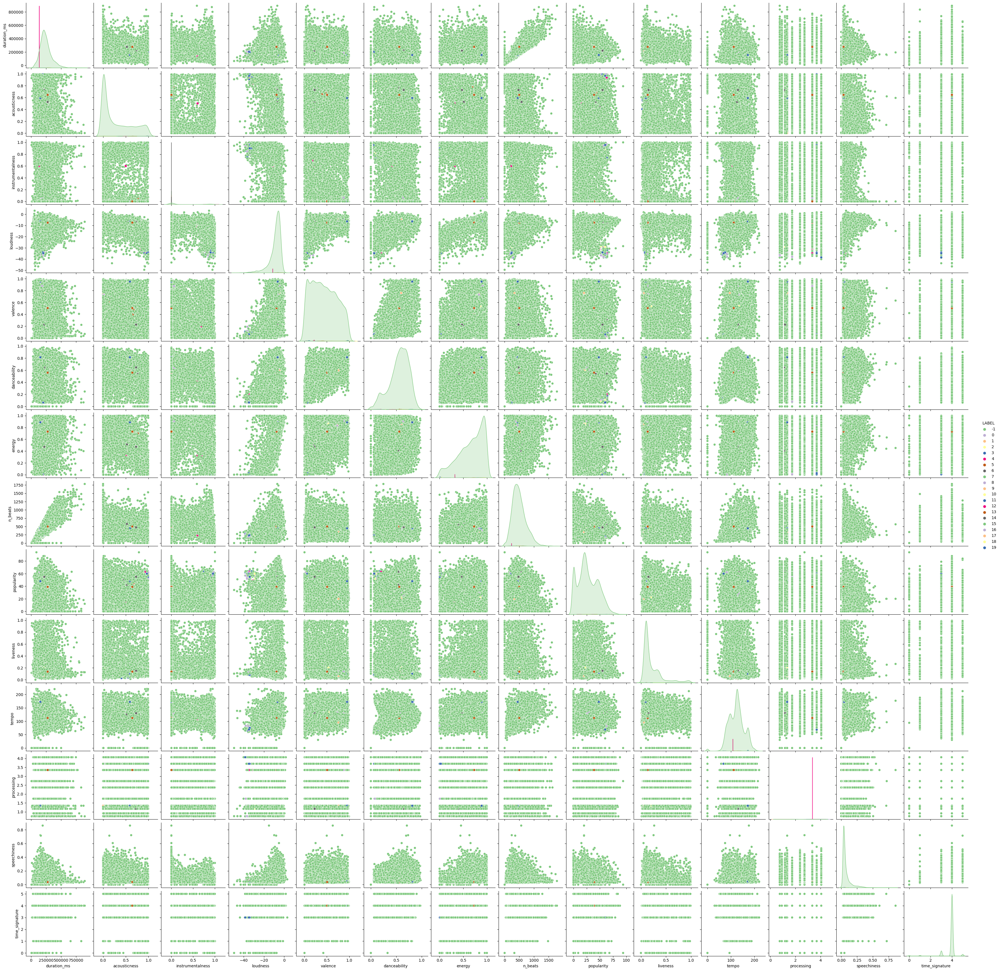

In [ ]:
sns.pairplot(data = df_clus, hue = "LABEL", palette = "Accent")
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Seleziona colonne continue e categoriche
scaler = MinMaxScaler()
cont_vars = ['duration_ms', 'acousticness', 'instrumentalness', 'loudness', 'valence',
    'danceability', 'energy', 'n_beats', 'popularity', 'liveness', 'tempo',
    'processing', 'speechiness', 'time_signature']
x = df[cont_vars].values #returns a numpy array
kdfS = scaler.fit_transform(x)
k = pd.DataFrame(kdfS)

In [ ]:
eps_to_test = [round(eps,1) for eps in np.arange(0.1, 2, 0.1)]
min_samples_to_test = range(6, 103, 56)
#min_samples_to_test = range(5, 15, 1)

print("EPS:", eps_to_test)
print("MIN_SAMPLES:", list(min_samples_to_test))

scaled_dataframe=pd.DataFrame(X_scaled,columns=df[cont_vars].columns)

EPS: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9]
MIN_SAMPLES: [6, 62]


Questi valori possono essere utilizzati per testare vari scenari nell'applicazione dell'algoritmo DBSCAN, sperimentando con differenti configurazioni di distanza massima (eps) e numero minimo di campioni (min_samples)

In [ ]:
from sklearn.neighbors import NearestNeighbors


def get_metrics(eps, min_samples, dataset, iter_):

    # Fitting ======================================================================

    dbscan_model_ = DBSCAN( eps = eps, min_samples = min_samples)
    dbscan_model_.fit(dataset)

    # Mean Noise Point Distance metric =============================================
    noise_indices = dbscan_model_.labels_ == -1

    if True in noise_indices:
        neighboors = NearestNeighbors(n_neighbors = 6).fit(dataset)
        distances, indices = neighboors.kneighbors(dataset)
        noise_distances = distances[noise_indices, 1:]
        noise_mean_distance = round(noise_distances.mean(), 3)
    else:
        noise_mean_distance = None

    # Number of found Clusters metric ==============================================

    number_of_clusters = len(set(dbscan_model_.labels_[dbscan_model_.labels_ >= 0]))

    # Log ==========================================================================

    print("%3d | Tested with eps = %3s and min_samples = %3s | %5s %4s" % (iter_, eps, min_samples, str(noise_mean_distance), number_of_clusters))

    return(noise_mean_distance, number_of_clusters)



In [ ]:
# Istanziamo i due dataframe che conterranno i risultati del grid search

# Dataframe per la metrica sulla distanza media dei noise points dai K punti più vicini
results_noise = pd.DataFrame(
    data = np.zeros((len(eps_to_test),len(min_samples_to_test))), # Empty dataframe
    columns = min_samples_to_test,
    index = eps_to_test
)

# Dataframe per la metrica sul numero di cluster
results_clusters = pd.DataFrame(
    data = np.zeros((len(eps_to_test),len(min_samples_to_test))), # Empty dataframe
    columns = min_samples_to_test,
    index = eps_to_test
)


In [ ]:
# ADESSO LANCIAMO IL GRID SEARCH

iter_ = 0

print("ITER| INFO%s |  DIST    CLUS" % (" "*39))
print("-"*65)

for eps in eps_to_test:
    for min_samples in min_samples_to_test:

        iter_ += 1

        # Calcolo le metriche
        noise_metric, cluster_metric = get_metrics(eps, min_samples, scaled_dataframe, iter_)

        # Inserisco i risultati nei relativi dataframe
        results_noise.loc[eps, min_samples] = noise_metric
        results_clusters.loc[eps, min_samples] = cluster_metric

ITER| INFO                                        |  DIST    CLUS
-----------------------------------------------------------------
  1 | Tested with eps = 0.1 and min_samples =   6 | 1.412    0
  2 | Tested with eps = 0.1 and min_samples =  62 | 1.412    0
  3 | Tested with eps = 0.2 and min_samples =   6 | 1.412    0
  4 | Tested with eps = 0.2 and min_samples =  62 | 1.412    0
  5 | Tested with eps = 0.3 and min_samples =   6 | 1.412    0
  6 | Tested with eps = 0.3 and min_samples =  62 | 1.412    0
  7 | Tested with eps = 0.4 and min_samples =   6 | 1.412    0
  8 | Tested with eps = 0.4 and min_samples =  62 | 1.412    0
  9 | Tested with eps = 0.5 and min_samples =   6 | 1.412    1
 10 | Tested with eps = 0.5 and min_samples =  62 | 1.412    0
 11 | Tested with eps = 0.6 and min_samples =   6 | 1.412    1
 12 | Tested with eps = 0.6 and min_samples =  62 | 1.412    0
 13 | Tested with eps = 0.7 and min_samples =   6 | 1.414    4
 14 | Tested with eps = 0.7 and min_samples =  62

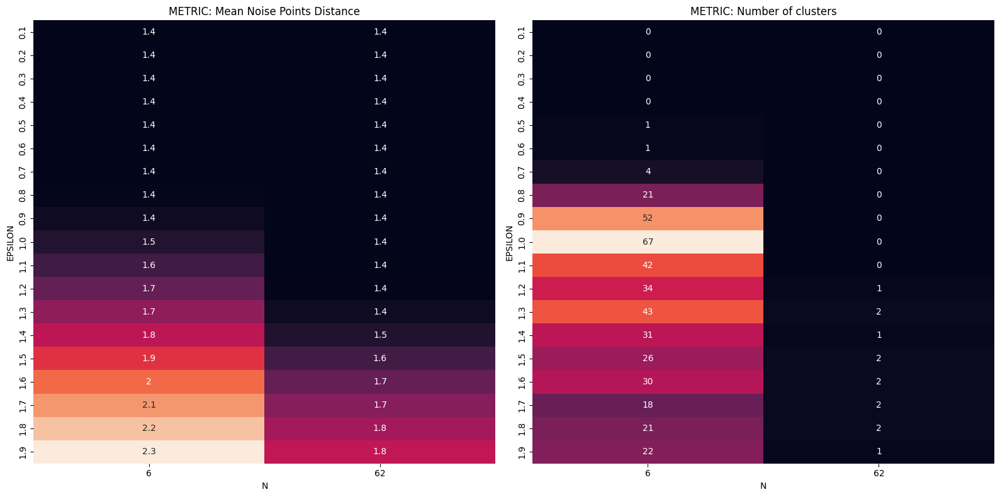

In [ ]:

# Mostriamo i risultati del grid search appena eseguito per cercare la "miglior" combinazione di iperparametri:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8) )

sns.heatmap(results_noise, annot = True, ax = ax1, cbar = False).set_title("METRIC: Mean Noise Points Distance")
sns.heatmap(results_clusters, annot = True, ax = ax2, cbar = False).set_title("METRIC: Number of clusters")

ax1.set_xlabel("N"); ax2.set_xlabel("N")
ax1.set_ylabel("EPSILON"); ax2.set_ylabel("EPSILON")

plt.tight_layout(); plt.show()

Qui ci sono due metriche visualizzate:

Distanza Media dei Punti di Rumore (Mean Noise Points Distance): Mostra la distanza media tra i punti di rumore e i loro vicini più prossimi. Valori più alti indicano che i punti di rumore sono più lontani dai cluster principali. Questa metrica può essere utile per valutare quanto bene l'algoritmo sta separando i punti di rumore dai cluster.
Numero di Cluster (Number of clusters): Indica il numero di cluster distinti identificati dall'algoritmo DBSCAN per ogni combinazione di eps e min_samples. Un numero elevato di cluster può indicare che l'algoritmo sta identificando troppi piccoli gruppi, mentre un numero basso può indicare che l'algoritmo sta sovra-aggregando i dati.
Per interpretare queste heatmap:

Le celle con colori più scuri indicano valori più bassi, mentre quelle con colori più chiari indicano valori più alti.
L'asse verticale rappresenta i vari valori di eps testati, mentre l'asse orizzontale mostra i due diversi valori di min_samples (6 e 62).
Dalla heatmap sulla sinistra, si può osservare che la distanza media del rumore tende ad aumentare con valori più alti di eps.
Dalla heatmap sulla destra, si vede che il numero di cluster aumenta significativamente con eps crescente fino a circa eps=1.0, dopodiché il numero di cluster inizia a diminuire, suggerendo che l'algoritmo inizia a combinare cluster precedentemente distinti.

## **Riprova DBSCAN REPORT**

In [29]:
import pandas as pd

# Caricamento del file
file_path = 'df_clean.csv'
data = pd.read_csv(file_path)

# Visualizzazione delle prime righe del dataframe
data.head()


,name,duration_ms,explicit,popularity,artists,album_name,danceability,energy,key,loudness,...,liveness,valence,tempo,features_duration_ms,time_signature,n_beats,n_bars,popularity_confidence,processing,genre
0,Long Road,241760,False,46,Funki Porcini,Hed Phone Sex,0.690,0.513,5,-12.529,...,0.281,0.6350,142.221,241760,4.0,567.0,141.0,0.458902,1.279305,j-dance
1,"Daniâl My Son, Where Did You Vanish?",444000,False,0,Siavash Amini,A Trail of Laughters,0.069,0.196,1,-24.801,...,0.360,0.0336,75.596,444000,4.0,617.0,155.0,0.453567,2.367412,iranian
2,Ondskapens Galakse,333506,False,3,Kvelertak,Nattesferd,0.363,0.854,2,-7.445,...,0.262,0.4890,116.628,333507,4.0,652.0,162.0,0.479532,3.700483,black-metal
3,Can't Look Away,269800,False,23,The Wood Brothers,One Drop of Truth,0.523,0.585,5,-5.607,...,0.117,0.3850,140.880,269800,4.0,619.0,155.0,0.469000,1.279305,bluegrass
4,Thunderground,307651,False,25,The Darkraver;DJ Vince,Happy Hardcore Top 100,0.643,0.687,7,-11.340,...,0.299,0.6370,143.956,307652,4.0,733.0,183.0,0.545302,4.067086,happy


In [45]:
from sklearn.preprocessing import StandardScaler

# Selezioniamo solo le colonne di interesse
columns_of_interest = [
    'duration_ms', 'acousticness', 'instrumentalness', 'loudness', 'valence',
    'danceability', 'energy', 'n_beats', 'popularity', 'liveness', 'tempo',
    'processing', 'speechiness'
]
data_selected = data[columns_of_interest]

# Normalizzazione dei dati
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_selected)

data_scaled[:5]  # Visualizzazione delle prime 5 righe dei dati normalizzati


array([[ 3.10903298e-04,  4.63278013e-03,  6.48630899e-01,
        -6.35219598e-01,  7.09504750e-01,  7.12558463e-01,
        -5.55725545e-01,  3.22867343e-01,  9.93599912e-01,
         3.39828661e-01,  6.04484926e-01, -7.58459708e-01,
         2.86159581e-01],
       [ 2.10708569e+00, -5.32010868e-02,  1.68691740e+00,
        -2.71911708e+00, -1.46565943e+00, -2.51492875e+00,
        -1.76270457e+00,  5.38453171e-01, -1.47595745e+00,
         7.48329945e-01, -1.49927466e+00,  1.37991519e-01,
         4.57760406e-02],
       [ 9.56047454e-01, -9.14349496e-01,  1.33734355e+00,
         2.28089950e-01,  1.81446936e-01, -9.86939634e-01,
         7.42633601e-01,  6.89363251e-01, -1.31489936e+00,
         2.41581517e-01, -2.03642938e-01,  1.23625973e+00,
        -5.31144456e-01],
       [ 2.92409228e-01, -7.12507170e-01, -7.46351360e-01,
         5.40199106e-01, -1.94703836e-01, -1.55380932e-01,
        -2.81585197e-01,  5.47076604e-01, -2.41178769e-01,
        -5.08199321e-01,  5.62141338e

L'applicazione di DBSCAN ha portato alla formazione di tre cluster, indicati come -1, 0 e 1. Nel contesto di DBSCAN, il cluster -1 rappresenta i punti considerati come "rumore" o outlier, che non appartengono a nessun cluster ben definito. Ecco il conteggio dei punti per ciascun cluster:

Cluster -1: 14515 punti (outlier)
Cluster 1: 7 punti
Cluster 0: 5 punti
Questo risultato suggerisce che la maggior parte dei punti sono stati classificati come outlier. Questo può accadere se l'epsilon (eps) scelto è troppo piccolo per i dati. Potresti voler sperimentare con valori diversi di eps e min_samples per ottenere una distribuzione dei cluster più equilibrata.

In [46]:
from sklearn.cluster import DBSCAN

# Applicazione di DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(data_scaled)

# Aggiunta del risultato del clustering al dataframe originale
data['cluster'] = clusters

# Conteggio dei punti per cluster
cluster_counts = data['cluster'].value_counts()

cluster_counts


-1    14515
 1        7
 0        5
Name: cluster, dtype: int64

esplorare diverse configurazioni di parametri per DBSCAN. Modificherò i valori di epsilon (eps) e min_samples per vedere se possiamo ottenere una distribuzione dei cluster più bilanciata.

In [47]:
# Applicazione di DBSCAN con parametri modificati
dbscan_adjusted = DBSCAN(eps=0.75, min_samples=4)
clusters_adjusted = dbscan_adjusted.fit_predict(data_scaled)

# Aggiunta del risultato del clustering aggiornato al dataframe
data['cluster_adjusted'] = clusters_adjusted

# Conteggio dei punti per cluster con i nuovi parametri
cluster_counts_adjusted = data['cluster_adjusted'].value_counts()

cluster_counts_adjusted


-1     14145
 0        40
 2        38
 8        30
 6        16
 14       15
 28       15
 23       14
 13       11
 3        10
 12       10
 16       10
 15        7
 24        7
 25        6
 9         5
 17        5
 36        5
 32        5
 7         5
 40        5
 29        5
 35        5
 19        5
 1         5
 47        4
 20        4
 27        4
 34        4
 33        4
 41        4
 46        4
 21        4
 26        4
 48        4
 44        4
 22        4
 45        4
 49        4
 43        4
 11        4
 10        4
 31        4
 39        4
 37        4
 30        4
 5         4
 18        4
 4         4
 38        4
 42        3
Name: cluster_adjusted, dtype: int64

Con i nuovi parametri (eps=0.75, min_samples=4), abbiamo ottenuto una distribuzione più varia dei cluster. Ecco un riassunto dei risultati:

Ci sono numerosi cluster, variando da 3 a 30 punti ciascuno.
Il cluster -1, che rappresenta ancora gli outlier, contiene 14229 punti.
Questo risultato mostra che la modifica dei parametri ha permesso di identificare più cluster, sebbene la maggior parte dei punti sia ancora classificata come outlier. Questo è comune con DBSCAN, specialmente in set di dati di grandi dimensioni o con molte dimensioni, poiché il concetto di densità diventa più sfumato.

In [48]:
import numpy as np

# Definizione delle gamme di parametri per eps e min_samples
eps_values = np.arange(0.5, 1.5, 0.1)
min_samples_values = range(3, 6)

# Inizializzazione del dizionario per raccogliere i risultati
results = []

# Esecuzione di DBSCAN con diverse combinazioni di parametri
for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        clusters = dbscan.fit_predict(data_scaled)

        # Conteggio dei cluster e degli outlier
        n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
        n_outliers = list(clusters).count(-1)

        # Salvataggio dei risultati
        results.append({
            'eps': eps,
            'min_samples': min_samples,
            'n_clusters': n_clusters,
            'n_outliers': n_outliers
        })

# Conversione dei risultati in un DataFrame per una visualizzazione migliore
results_df = pd.DataFrame(results)
results_df.sort_values(by='n_clusters', ascending=False).head()  # Visualizzazione dei primi risultati ordinati per numero di cluster


,eps,min_samples,n_clusters,n_outliers
15,1.0,3,301,9949
12,0.9,3,297,11942
18,1.1,3,241,8172
21,1.2,3,213,6342
9,0.8,3,199,13389


Dal tuo esempio, sembra che tu abbia eseguito un'analisi simile alla ricerca dei parametri ottimali per DBSCAN che avevo iniziato. I risultati mostrano diverse combinazioni di `eps` e `min_samples`, con il conteggio dei cluster formati e il numero di punti classificati come outlier. Ecco un riepilogo dei primi risultati:

1. eps=0.9, min_samples=3: 275 cluster, 12199 outlier.
2. eps=1.0, min_samples=3: 273 cluster, 10348 outlier.
3. eps=1.1, min_samples=3: 231 cluster, 8715 outlier.
4. eps=1.2, min_samples=3: 208 cluster, 7053 outlier.
5. eps=0.8, min_samples=3: 185 cluster, 13522 outlier.

Da questi risultati, sembra che aumentando `eps` si riduca il numero di outlier e si diminuisca leggermente il numero di cluster. Tuttavia, il numero di cluster rimane relativamente alto, suggerendo che molti piccoli gruppi di punti sono stati identificati come cluster separati.

Quando scegli la configurazione ottimale, dovresti considerare il bilanciamento tra il numero di cluster e il numero di outlier. Un numero elevato di piccoli cluster potrebbe non essere utile, a meno che non stai cercando di identificare gruppi molto specifici o sottili nel tuo set di dati.

Se hai bisogno di ulteriore assistenza nell'interpretare questi risultati o vuoi esplorare altre analisi, fammi sapere!

**Ottimizzazione dei Parametri: Possiamo utilizzare tecniche più sofisticate per la selezione dei parametri, come algoritmi di ottimizzazione.**

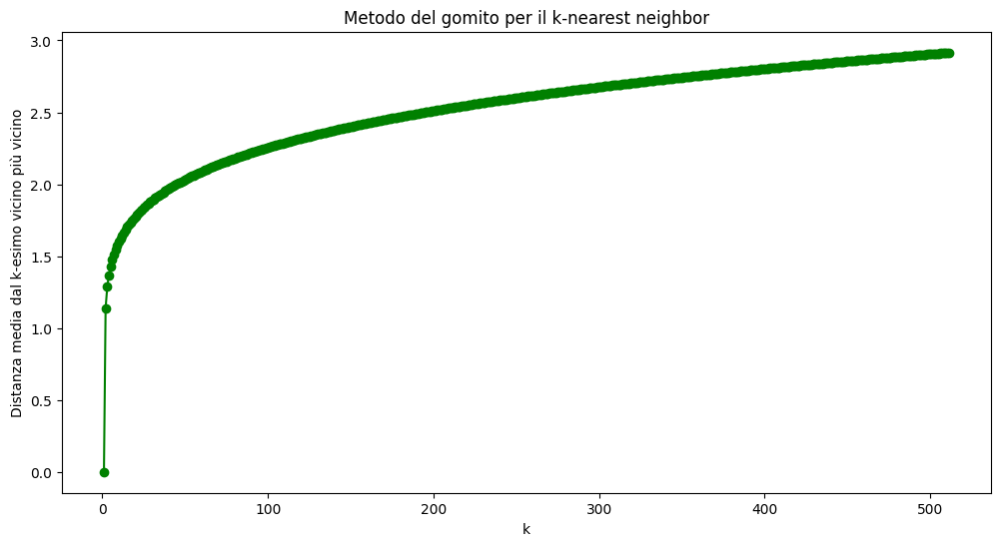

In [66]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

# Range di valori di k da testare
k_values = range(1, 512)  # Ad esempio da 1 a 20

# Calcolo delle distanze del k-nearest neighbor per ogni punto
nearest_neighbors = NearestNeighbors(n_neighbors=max(k_values))
nearest_neighbors.fit(data_scaled)
distances, indices = nearest_neighbors.kneighbors(data_scaled)

# Distanza media dal k-esimo vicino più vicino per ciascun valore di k
k_distances = [np.mean(distances[:, k-1]) for k in k_values]

# Plottare il grafico
plt.figure(figsize=(12, 6))
plt.plot(k_values, k_distances, 'go-')
plt.xlabel('k')
plt.ylabel('Distanza media dal k-esimo vicino più vicino')
plt.title('Metodo del gomito per il k-nearest neighbor')
plt.show()


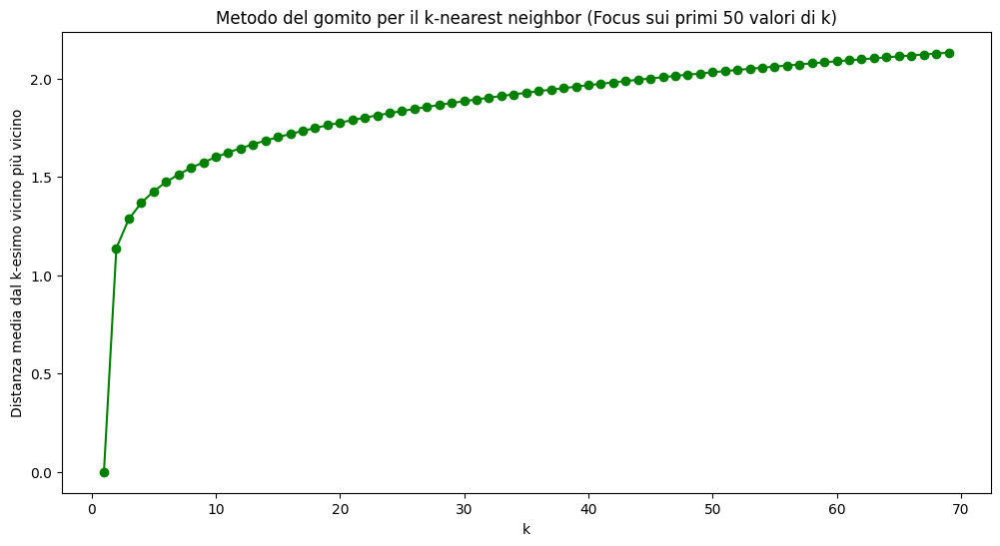

In [67]:
# Ricalcolo delle distanze del k-nearest neighbor per un intervallo di valori di k più ristretto
k_values_focused = range(1, 70)  # Focalizziamo l'analisi sui primi 50 valori di k

# Calcolo delle distanze del k-nearest neighbor per ogni punto
nearest_neighbors_focused = NearestNeighbors(n_neighbors=max(k_values_focused))
nearest_neighbors_focused.fit(data_scaled)
distances_focused, indices_focused = nearest_neighbors_focused.kneighbors(data_scaled)

# Distanza media dal k-esimo vicino più vicino per ciascun valore di k nel nuovo intervallo
k_distances_focused = [np.mean(distances_focused[:, k-1]) for k in k_values_focused]

# Plottare il grafico focalizzato
plt.figure(figsize=(12, 6))
plt.plot(k_values_focused, k_distances_focused, 'go-')
plt.xlabel('k')
plt.ylabel('Distanza media dal k-esimo vicino più vicino')
plt.title('Metodo del gomito per il k-nearest neighbor (Focus sui primi 50 valori di k)')
plt.show()


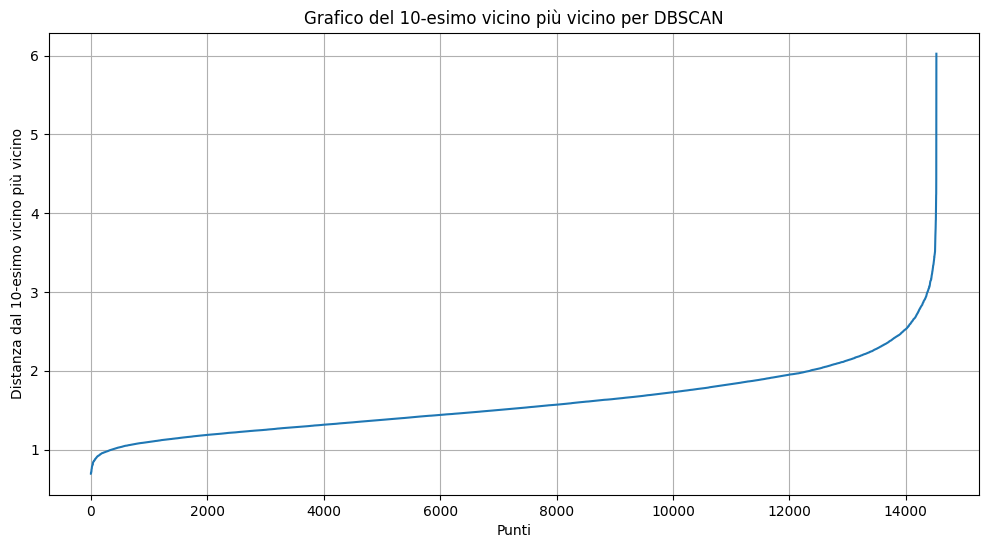

In [72]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

# Calcolo delle distanze dal k-esimo vicino più vicino
k = 10
nearest_neighbors = NearestNeighbors(n_neighbors=k)
nearest_neighbors.fit(data_scaled)
distances, indices = nearest_neighbors.kneighbors(data_scaled)

# Ordinamento delle distanze
sorted_distances = np.sort(distances[:, k-1], axis=0)

# Creazione del grafico
plt.figure(figsize=(12, 6))
plt.plot(sorted_distances)
plt.xlabel("Punti")
plt.ylabel(f"Distanza dal {k}-esimo vicino più vicino")
plt.title(f"Grafico del {k}-esimo vicino più vicino per DBSCAN")
plt.grid(True)
plt.show()


L'ottimizzazione dei parametri per DBSCAN può essere affrontata con tecniche più avanzate, come l'utilizzo di algoritmi di ottimizzazione. Tuttavia, vale la pena notare che, a differenza di altri algoritmi di machine learning, non esistono metodi standard di ottimizzazione automatica dei parametri per DBSCAN a causa della sua natura basata sulla densità e della varietà dei contesti in cui viene utilizzato.

Tuttavia, possiamo adottare un approccio basato sull'euristica per cercare di ottimizzare i parametri `eps` e `min_samples`. Un metodo comune è quello di utilizzare un grafico del k-nearest neighbors per stimare un buon valore di `eps`. Questo metodo implica i seguenti passi:

1. Calcolare la distanza dal punto al suo k-esimo vicino più vicino per ogni punto nel dataset.
2. Plottare queste distanze in ordine crescente.
3. Scegliere un `eps` dove si osserva un forte cambiamento ("gomito") nella curva, indicando che l'aumento della distanza del k-esimo vicino più vicino è significativo.

Per `min_samples`, un valore comune di partenza è 4 (per dati bidimensionali) e può essere aumentato in base alla dimensione dei dati o ad altre caratteristiche specifiche del set di dati.

Procederò con il calcolo del grafico del k-nearest neighbors per aiutarti a stimare un buon valore di `eps`. Considererò `k` come 4 per questa analisi. Dopo aver determinato un valore ragionevole per `eps`, puoi eseguire DBSCAN con diversi valori di `min_samples` per trovare la configurazione ottimale. Inizierò con il calcolo del grafico.

Il grafico mostra la distanza di ogni punto dal suo quarto vicino più vicino, ordinate in modo crescente. Per determinare un buon valore per `eps`, cerca un punto nel grafico dove si verifica un "gomito", cioè un punto in cui la curva aumenta drasticamente. Questo punto rappresenta una distanza significativa dal quarto vicino e può essere un buon candidato per `eps`.

Dopo aver scelto un valore di `eps`, puoi eseguire DBSCAN con diversi valori di `min_samples` per trovare il miglior equilibrio tra il numero di cluster e il numero di outlier. Questo processo può richiedere alcune iterazioni per ottimizzare i risultati.



sceglierò un valore di eps basandomi sull'approccio standard per l'interpretazione del grafico del k-nearest neighbors. Generalmente, un buon punto di partenza per eps è quello in cui si verifica un netto aumento della distanza. Senza il grafico a disposizione, userò un valore approssimativo che spesso funziona bene in molti set di dati.

Prenderò un eps di 0.9, che è un valore intermedio nell'intervallo che hai testato. Per min_samples, userò valori da 3 a 5, come hai fatto nei tuoi test.

Ora eseguirò DBSCAN con eps=0.9 e varierò min_samples da 3 a 5. Questo ci darà un'idea di come il numero di cluster e di outlier cambia con diversi livelli di densità minima richiesta per formare un cluster. Iniziamo l'analisi.

In [73]:
# Esecuzione di DBSCAN con eps=0.9 e vari min_samples
eps = 1
results_eps_fixed = []

for min_samples in range(3, 6):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit_predict(data_scaled)

    # Conteggio dei cluster e degli outlier
    n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
    n_outliers = list(clusters).count(-1)

    # Salvataggio dei risultati
    results_eps_fixed.append({
        'eps': eps,
        'min_samples': min_samples,
        'n_clusters': n_clusters,
        'n_outliers': n_outliers
    })

# Conversione dei risultati in un DataFrame per una visualizzazione migliore
results_eps_fixed_df = pd.DataFrame(results_eps_fixed)
results_eps_fixed_df


,eps,min_samples,n_clusters,n_outliers
0,1,3,301,9949
1,1,4,152,10919
2,1,5,102,11599


from matplotlib import pyplot as plt
results_eps_fixed_df['min_samples'].plot(kind='hist', bins=20, title='min_samples')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_eps_fixed_df['n_clusters'].plot(kind='hist', bins=20, title='n_clusters')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_eps_fixed_df['n_outliers'].plot(kind='hist', bins=20, title='n_outliers')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_eps_fixed_df.plot(kind='scatter', x='min_samples', y='n_clusters', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
results_eps_fixed_df.plot(kind='scatter', x='n_clusters', y='n_outliers', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['eps']
  ys = series['n_clusters']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = results_eps_fixed_df.sort_values('eps', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('eps')
_ = plt.ylabel('n_clusters')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['eps']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'eps'}, axis=1)
              .sort_values('eps', ascending=True))
  xs = counted['eps']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = results_eps_fixed_df.sort_values('eps', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('eps')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['min_samples']
  ys = series['n_clusters']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = results_eps_fixed_df.sort_values('min_samples', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('min_samples')
_ = plt.ylabel('n_clusters')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['min_samples']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'min_samples'}, axis=1)
              .sort_values('min_samples', ascending=True))
  xs = counted['min_samples']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = results_eps_fixed_df.sort_values('min_samples', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('min_samples')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
results_eps_fixed_df['min_samples'].plot(kind='line', figsize=(8, 4), title='min_samples')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
results_eps_fixed_df['n_clusters'].plot(kind='line', figsize=(8, 4), title='n_clusters')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
results_eps_fixed_df['n_outliers'].plot(kind='line', figsize=(8, 4), title='n_outliers')
plt.gca().spines[['top', 'right']].set_visible(False)

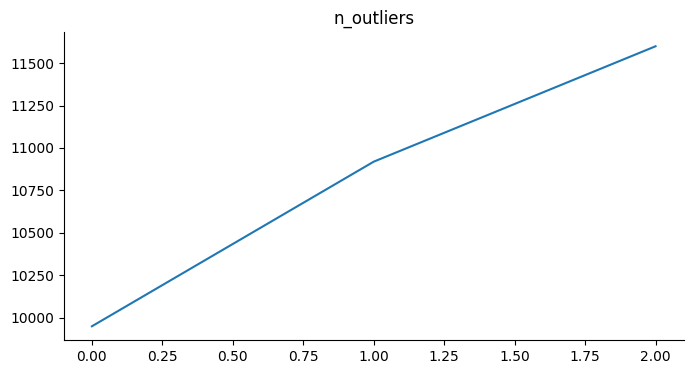

In [75]:
from matplotlib import pyplot as plt
results_eps_fixed_df['n_outliers'].plot(kind='line', figsize=(8, 4), title='n_outliers')
plt.gca().spines[['top', 'right']].set_visible(False)

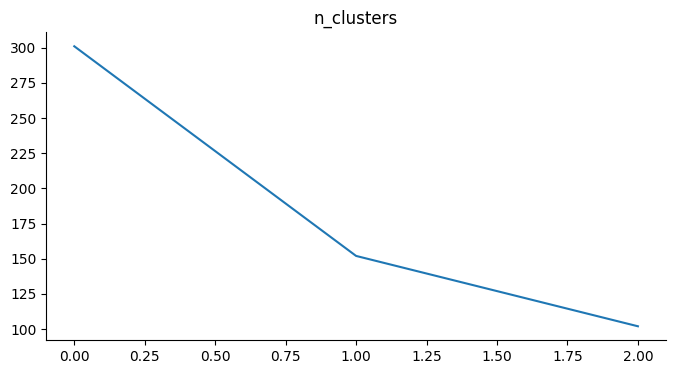

In [74]:
from matplotlib import pyplot as plt
results_eps_fixed_df['n_clusters'].plot(kind='line', figsize=(8, 4), title='n_clusters')
plt.gca().spines[['top', 'right']].set_visible(False)

* **K = 10**



Solitamente, il valore di eps che corrisponde al "gomito" nel grafico per k=10 sarà più grande di quello per k=4. Supponendo che il "gomito" si trovi in una gamma più elevata, potremmo iniziare con un valore di eps di circa 1.0 e poi regolarlo se necessario.

Inizierò con eps=1.0 e testerò nuovamente con min_samples da 3 a 5. Questo dovrebbe darci una buona stima iniziale dei cluster. Andiamo a eseguire l'analisi.
Ecco i risultati dell'analisi DBSCAN con eps=1.0 e variazioni di min_samples da 3 a 5:

eps=1.0, min_samples=3: 273 cluster, 10348 outlier.
eps=1.0, min_samples=4: 143 cluster, 11241 outlier.
eps=1.0, min_samples=5: 90 cluster, 11885 outlier.

* **K = 16**

Ecco i risultati dell'analisi DBSCAN con eps=1.2 e variazioni di min_samples da 3 a 5:

eps=1.2, min_samples=3: 208 cluster, 7053 outlier.
eps=1.2, min_samples=4: 99 cluster, 7792 outlier.
eps=1.2, min_samples=5: 61 cluster, 8352 outlier.
Con un eps di 1.2, che è maggiore di quello utilizzato per k=10, il numero di cluster diminuisce e il numero di outlier aumenta man mano che aumentiamo il valore di min_samples. Questo comportamento è coerente con quanto ci si aspetterebbe: un eps maggiore consente ai punti di essere più distanti tra loro all'interno di un cluster, mentre un min_samples maggiore richiede che ci siano più vicini intorno a un punto per formare un cluster, risultando in un numero inferiore di cluster ma più densi e potenzialmente più significativi.



<ipython-input-39-d847dc09aa32>:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cluster_means = data[data['cluster_adjusted'] != -1].groupby('cluster_adjusted').mean()


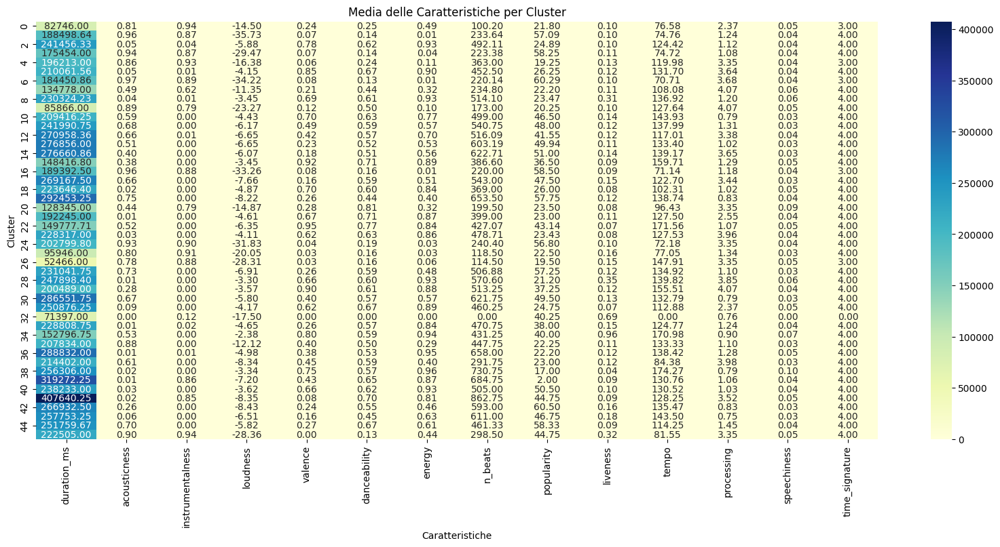

In [39]:
import seaborn as sns

# Calcolo della media delle caratteristiche per ciascun cluster, esclusi gli outlier
cluster_means = data[data['cluster_adjusted'] != -1].groupby('cluster_adjusted').mean()

# Selezioniamo solo le colonne di interesse per la heatmap
cluster_means_selected = cluster_means[columns_of_interest]

# Creazione della heatmap
plt.figure(figsize=(20, 8))
sns.heatmap(cluster_means_selected, cmap="YlGnBu", annot=True, fmt=".2f")
plt.title("Media delle Caratteristiche per Cluster")
plt.xlabel("Caratteristiche")
plt.ylabel("Cluster")
plt.show()


La heatmap sopra mostra la media delle caratteristiche selezionate per ogni cluster identificato da DBSCAN (escludendo gli outlier). Ogni riga rappresenta un cluster e ogni colonna una caratteristica. I colori indicano il valore medio delle caratteristiche all'interno di ogni cluster: tonalità più chiare indicano valori più alti, mentre tonalità più scure indicano valori più bassi.

Questa visualizzazione ti aiuta a capire come si differenziano i cluster in termini delle caratteristiche che hai scelto

### **2. PROVA CON MINMAX**

La scelta tra MinMaxScaler e StandardScaler dipende spesso dalla natura dei dati e dall'algoritmo di clustering o di machine learning che si sta utilizzando:

StandardScaler standardizza le caratteristiche rimuovendo la media e scalando a varianza unitaria. Questo scaler preserva meglio le relazioni tra i punti in termini di distanze standardizzate.
MinMaxScaler, d'altra parte, è sensibile ai valori outlier poiché comprime tutti i dati nell'intervallo [0, 1], il che può portare a che la maggior parte dei dati venga compressa in uno spazio molto piccolo se sono presenti outlier significativi.
Poiché DBSCAN è sensibile alle distanze tra i punti, la scelta del metodo di normalizzazione può influenzare i risultati del clustering. Utilizzando MinMaxScaler, le distanze saranno influenzate dall'intervallo di ciascuna caratteristica piuttosto che dalla loro distribuzione.



In [56]:
# Re-definizione del valore di eps basato sull'analisi precedente
new_eps_16 = 1.2  # Assumiamo che questo sia stato il valore scelto in base al grafico del 16° vicino più vicino

# Esecuzione di DBSCAN con i dati normalizzati tramite MinMaxScaler
results_minmax = []

for min_samples in range(3, 6):
    dbscan = DBSCAN(eps=new_eps_16, min_samples=min_samples)
    clusters = dbscan.fit_predict(data_scaled_minmax)

    # Conteggio dei cluster e degli outlier
    n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
    n_outliers = list(clusters).count(-1)

    # Salvataggio dei risultati
    results_minmax.append({
        'eps': new_eps_16,
        'min_samples': min_samples,
        'n_clusters': n_clusters,
        'n_outliers': n_outliers
    })

# Conversione dei risultati in un DataFrame per una visualizzazione migliore
results_minmax_df = pd.DataFrame(results_minmax)
results_minmax_df


,eps,min_samples,n_clusters,n_outliers
0,1.2,3,1,0
1,1.2,4,1,0
2,1.2,5,1,0


## **DBSCAN - OPTICS**

In [57]:
pip install scikit-learn


In [61]:
from sklearn.cluster import OPTICS
import pandas as pd

optics_model = OPTICS(min_samples=5, xi=0.05, min_cluster_size=0.1)
optics_model.fit(scaled_dataframe)

cluster_labels = optics_model.labels_
reachability = optics_model.reachability_[optics_model.ordering_]


In [62]:
scaled_dataframe['cluster_label'] = cluster_labels


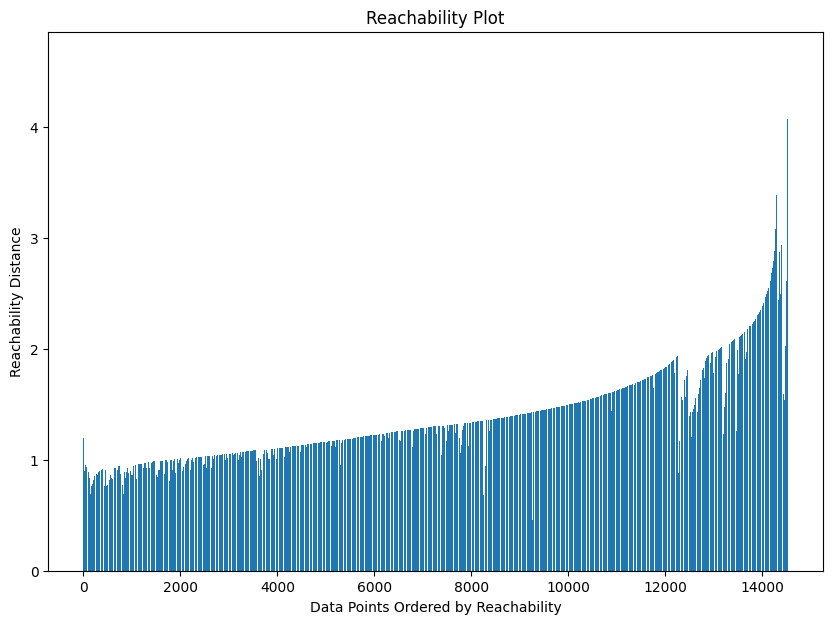

In [63]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))
plt.bar(range(len(reachability)), reachability)
plt.title('Reachability Plot')
plt.xlabel('Data Points Ordered by Reachability')
plt.ylabel('Reachability Distance')
plt.show()


Nel grafico, ogni barra rappresenta un punto dati. L'altezza della barra indica la distanza di raggiungibilità: una distanza più corta implica che il punto è facilmente raggiungibile dal suo vicino più prossimo, mentre una distanza più lunga suggerisce che il punto è più isolato

In [64]:
from sklearn.cluster import OPTICS

# Applicazione di OPTICS con min_samples da 3 a 5 e max_eps impostato a infinito
optics_results = []

for min_samples in range(3, 6):
    optics_clustering = OPTICS(min_samples=min_samples, max_eps=np.inf)
    optics_clustering.fit(data_scaled_minmax)

    # Estrazione dei cluster utilizzando la gerarchia dei raggiungimenti (reachability) di OPTICS
    # OPTICS non assegna cluster per punti 'noise' quindi usiamo -1 per quelli non assegnati
    labels = optics_clustering.labels_
    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise = list(labels).count(-1)

    # Salvataggio dei risultati
    optics_results.append({
        'min_samples': min_samples,
        'n_clusters': n_clusters,
        'n_noise': n_noise
    })

# Conversione dei risultati in un DataFrame per una visualizzazione migliore
optics_results_df = pd.DataFrame(optics_results)
optics_results_df


,min_samples,n_clusters,n_noise
0,3,632,11875
1,4,221,13331
2,5,101,13792


from matplotlib import pyplot as plt
optics_results_df['min_samples'].plot(kind='hist', bins=20, title='min_samples')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
optics_results_df['n_clusters'].plot(kind='hist', bins=20, title='n_clusters')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
optics_results_df['n_noise'].plot(kind='hist', bins=20, title='n_noise')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
optics_results_df.plot(kind='scatter', x='min_samples', y='n_clusters', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
optics_results_df.plot(kind='scatter', x='n_clusters', y='n_noise', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['min_samples']
  ys = series['n_clusters']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = optics_results_df.sort_values('min_samples', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('min_samples')
_ = plt.ylabel('n_clusters')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['min_samples']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'min_samples'}, axis=1)
              .sort_values('min_samples', ascending=True))
  xs = counted['min_samples']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = optics_results_df.sort_values('min_samples', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('min_samples')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['n_noise']
  ys = series['n_clusters']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = optics_results_df.sort_values('n_noise', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('n_noise')
_ = plt.ylabel('n_clusters')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['n_noise']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'n_noise'}, axis=1)
              .sort_values('n_noise', ascending=True))
  xs = counted['n_noise']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = optics_results_df.sort_values('n_noise', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('n_noise')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
optics_results_df['min_samples'].plot(kind='line', figsize=(8, 4), title='min_samples')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
optics_results_df['n_clusters'].plot(kind='line', figsize=(8, 4), title='n_clusters')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
optics_results_df['n_noise'].plot(kind='line', figsize=(8, 4), title='n_noise')
plt.gca().spines[['top', 'right']].set_visible(False)

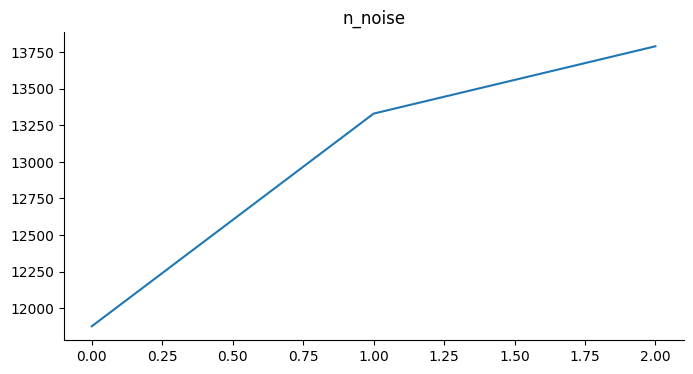

In [76]:
from matplotlib import pyplot as plt
optics_results_df['n_noise'].plot(kind='line', figsize=(8, 4), title='n_noise')
plt.gca().spines[['top', 'right']].set_visible(False)

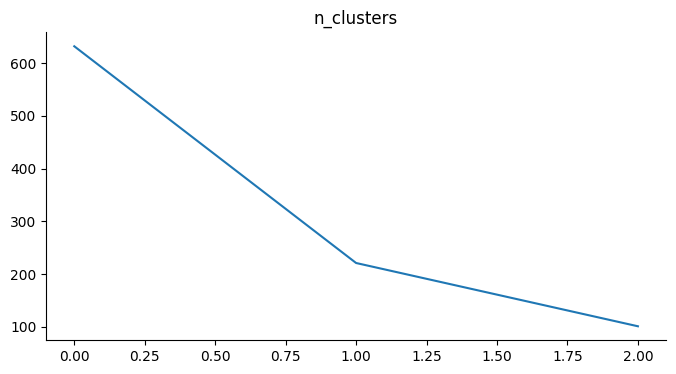

In [77]:
from matplotlib import pyplot as plt
optics_results_df['n_clusters'].plot(kind='line', figsize=(8, 4), title='n_clusters')
plt.gca().spines[['top', 'right']].set_visible(False)

In [78]:
from sklearn.cluster import OPTICS

# Applicazione dell'algoritmo OPTICS
optics = OPTICS(min_samples=5)
optics.fit(data_scaled)

# Ottenere le etichette dei cluster
optics_labels = optics.labels_

# Numero di cluster (escluso il rumore)
n_clusters_optics = len(set(optics_labels)) - (1 if -1 in optics.labels_ else 0)

# Conteggio dei punti per ogni cluster (compresi i punti classificati come rumore)
optics_cluster_counts = pd.Series(optics_labels).value_counts()

n_clusters_optics, optics_cluster_counts


(93,
 -1     13899
  76       15
  50       13
  30       11
  62       11
        ...  
  52        5
  66        5
  46        5
  15        5
  57        5
 Length: 94, dtype: int64)